In [1]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
!pip install dataprep
from dataprep.eda import plot, plot_correlation, create_report, plot_missing

In [3]:
df = pd.read_csv("03. [DAZONE2024] DATASET.csv")

In [4]:
df.head(10).T

,0,1,2,3,4,5,6,7,8,9
ID,6815,2567,6053,1985,6860,6520,4233,7567,7717,3162
Year_Of_Birth,1982.0,NaN,1982.0,2002.0,NaN,1982.0,1994.0,1987.0,1995.0,1983.0
Academic_Level,PhD,NaN,PhD,PhD,PhD,Graduation,Graduation,PhD,PhD,Master
Income,30396.0,83532.0,68682.0,63516.0,51650.0,44931.0,72679.0,66334.0,5648.0,17459.0
Registration_Time,30-04-2023,26-09-2022,06-10-2022,06-07-2022,11-05-2023,18-01-2023,18-09-2022,03-04-2022,NaN,19-09-2022
Recency,22.0,36.0,56.0,30.0,NaN,0.0,65.0,82.0,NaN,12.0
Liquor,16.0,756.0,920.0,142.0,153.0,79.0,620.0,910.0,29.0,7.0
Vegetables,2.0,NaN,2.0,13.0,5.0,2.0,56.0,13.0,NaN,6.0
Pork,6.0,562.0,505.0,114.0,22.0,11.0,260.0,218.0,NaN,16.0
Seafood,0.0,NaN,99.0,15.0,2.0,0.0,127.0,0.0,NaN,3.0


In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,3069.0,5.496270e+03,2.600610e+03,1.001000e+03,3.251000e+03,5.555000e+03,7.753000e+03,9.997000e+03
Year_Of_Birth,2832.0,1.987883e+03,4.914424e+00,1.975000e+03,1.985000e+03,1.988000e+03,1.991000e+03,2.002000e+03
Income,2782.0,5.248980e+04,2.443678e+04,1.730000e+03,3.579025e+04,5.184450e+04,6.859200e+04,6.666660e+05
Recency,2804.0,4.891797e+01,2.908131e+01,0.000000e+00,2.400000e+01,4.900000e+01,7.400000e+01,9.900000e+01
Liquor,2807.0,3.108073e+02,3.373875e+02,1.000000e+00,2.700000e+01,1.840000e+02,5.120000e+02,1.494000e+03
Vegetables,2810.0,2.820178e+01,3.977734e+01,2.000000e+00,3.000000e+00,1.000000e+01,3.400000e+01,2.010000e+02
Pork,2806.0,1.691333e+02,2.259937e+02,0.000000e+00,1.600000e+01,6.900000e+01,2.387500e+02,1.725000e+03
Seafood,2813.0,3.757092e+01,5.481114e+01,0.000000e+00,3.000000e+00,1.200000e+01,4.900000e+01,2.590000e+02
Candy,2840.0,2.710775e+01,4.102172e+01,0.000000e+00,1.000000e+00,9.000000e+00,3.400000e+01,2.630000e+02
Jewellery,2792.0,4.410208e+01,5.212511e+01,0.000000e+00,9.000000e+00,2.400000e+01,5.700000e+01,3.620000e+02


In [6]:
df.isna().sum()

ID                          0
Year_Of_Birth             237
Academic_Level            270
Income                    287
Registration_Time         245
Recency                   265
Liquor                    262
Vegetables                259
Pork                      263
Seafood                   256
Candy                     229
Jewellery                 277
Num_Deals_Purchases       228
Num_Web_Purchases         246
Num_Catalog_Purchases     258
Num_Store_Purchases       243
Num_Web_Visits_Month      270
Promo_30                  243
Promo_40                  254
Promo_50                  268
Promo_10                  235
Promo_20                  243
Complain                  256
Gender                    275
Phone                    1508
Phone_Number             1812
Year_Register             985
Month_Register            969
Total_Purchase            236
Living_With               248
Payment_Method            799
dtype: int64

In [7]:
df.Promo_40.describe().T

count    2815.000000
mean       -0.641918
std         0.538184
min        -1.000000
25%        -1.000000
50%        -1.000000
75%         0.000000
max         1.000000
Name: Promo_40, dtype: float64

#### Adjust outlier of Promo_40 that is outside the scope of the definition (Promo_40 equals 0 or 1)

In [8]:

df.loc[df.Promo_40 < 0, 'Promo_40'] = 0

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3069 entries, 0 to 3068
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     3069 non-null   int64  
 1   Year_Of_Birth          2832 non-null   float64
 2   Academic_Level         2799 non-null   object 
 3   Income                 2782 non-null   float64
 4   Registration_Time      2824 non-null   object 
 5   Recency                2804 non-null   float64
 6   Liquor                 2807 non-null   float64
 7   Vegetables             2810 non-null   float64
 8   Pork                   2806 non-null   float64
 9   Seafood                2813 non-null   float64
 10  Candy                  2840 non-null   float64
 11  Jewellery              2792 non-null   float64
 12  Num_Deals_Purchases    2841 non-null   float64
 13  Num_Web_Purchases      2823 non-null   float64
 14  Num_Catalog_Purchases  2811 non-null   float64
 15  Num_

#### Convert data type

In [10]:
# Convert the 'Registration_Time' column to datetime type
df.Registration_Time = pd.to_datetime(df.Registration_Time)

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\1830584547.py:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df.Registration_Time = pd.to_datetime(df.Registration_Time)


#### Check for duplicate IDs

In [11]:

duplicate_ids = df[df.duplicated(['ID'], keep=False)]

In [12]:
duplicate_ids

,ID,Year_Of_Birth,Academic_Level,Income,Registration_Time,Recency,Liquor,Vegetables,Pork,Seafood,...,Promo_20,Complain,Gender,Phone,Phone_Number,Year_Register,Month_Register,Total_Purchase,Living_With,Payment_Method
1,2567,NaN,NaN,83532.0,2022-09-26,36.0,756.0,NaN,562.0,NaN,...,0.0,0.0,Other,8.431989e+10,NaN,NaN,NaN,15.0,Together_0,NaN
4,6860,NaN,PhD,51650.0,2023-11-05,NaN,153.0,5.0,22.0,2.0,...,0.0,0.0,NaN,8.491216e+10,NaN,2023.0,NaN,10.0,Married_1,Mobile
5,6520,1982.0,Graduation,44931.0,2023-01-18,0.0,79.0,2.0,11.0,0.0,...,0.0,0.0,Female,8.406015e+10,NaN,NaN,NaN,7.0,Together_1,Mobile
8,7717,1995.0,PhD,5648.0,NaT,NaN,29.0,NaN,NaN,NaN,...,NaN,0.0,NaN,NaN,NaN,2023.0,3.0,NaN,Together_2,NaN
12,9801,1997.0,Master,41275.0,2023-03-24,33.0,25.0,6.0,22.0,0.0,...,0.0,0.0,Female,8.480906e+10,NaN,2023.0,3.0,11.0,Together_3,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3057,6792,1993.0,NaN,46107.0,NaT,78.0,32.0,11.0,NaN,NaN,...,0.0,0.0,Male,8.474501e+10,NaN,2023.0,2.0,7.0,Single_1,Card
3058,9791,1989.0,Graduation,30983.0,2021-09-11,50.0,52.0,6.0,50.0,12.0,...,0.0,0.0,Other,8.460524e+10,NaN,2021.0,11.0,8.0,Single_0,Mobile
3060,8764,1981.0,PhD,63246.0,2022-08-20,60.0,594.0,32.0,91.0,29.0,...,0.0,0.0,Female,8.457844e+10,NaN,2022.0,NaN,22.0,Married_2,Cash
3063,2986,1986.0,Graduation,92955.0,2022-08-19,35.0,694.0,23.0,925.0,31.0,...,0.0,0.0,Female,8.494378e+10,NaN,2022.0,NaN,23.0,Married_0,Cash


So the customer ID is duplicated. We will check if the customer ID is duplicated by Registration_Time

In [13]:
# Check duplicate IDs and see if they are distinct by date
distinct_dates_for_duplicates = duplicate_ids.groupby('ID')['Registration_Time'].nunique()
# Check if all duplicate IDs have distinct data by date
all_distinct = all(distinct_dates_for_duplicates > 1)

In [14]:
if all_distinct:
    print("\nAll duplicate IDs have distinct data by Registration_Time.")
else:
    print("\nNot all duplicate IDs have distinct data by Registration_Time.")


Not all duplicate IDs have distinct data by Registration_Time.


#### Removes duplicate ID thas have less data

In [15]:
# Add a new column to count the number of non-missing values in each row
df['num_non_missing'] = df.notna().sum(axis=1)

# Sort DataFrame by ID and no missing number of values (high to low)
df_sorted = df.sort_values(by=['ID', 'num_non_missing'], ascending=[True, False])

# Eliminate duplicates based on the ID column, keeping the first row (which is the most informative row)
df_deduplicated = df_sorted.drop_duplicates(subset='ID', keep='first')

# Remove temporary column num_non_missing
df_deduplicated = df_deduplicated.drop(columns='num_non_missing')

In [16]:
df_deduplicated.isna().sum()

ID                          0
Year_Of_Birth               0
Academic_Level              0
Income                     24
Registration_Time           0
Recency                     0
Liquor                      0
Vegetables                  0
Pork                        0
Seafood                     0
Candy                       0
Jewellery                   0
Num_Deals_Purchases         0
Num_Web_Purchases           0
Num_Catalog_Purchases       0
Num_Store_Purchases         0
Num_Web_Visits_Month        0
Promo_30                    0
Promo_40                    0
Promo_50                    0
Promo_10                    0
Promo_20                    0
Complain                    0
Gender                      0
Phone                    1000
Phone_Number             1240
Year_Register             580
Month_Register            573
Total_Purchase              0
Living_With                 0
Payment_Method            446
dtype: int64

#### Fill in Value

Registration_Time, Year_Register and Month_Register data are related data, but there is a contradiction when Registration_Time has data but Year_Register or Month_Register has no information, so we need to fill in all the information in those blank cells.

In [17]:
# Convert Registration_Time column to datetime type
df_deduplicated['Registration_Time'] = pd.to_datetime(df_deduplicated['Registration_Time'])
# Fill in missing values in the Year_Register column
df_deduplicated['Year_Register'] = df_deduplicated['Year_Register'].fillna(df_deduplicated['Registration_Time'].dt.year)
# Fill in missing values in Month_Register column
df_deduplicated['Month_Register'] = df_deduplicated['Month_Register'].fillna(df_deduplicated['Registration_Time'].dt.month.astype(str))

In [18]:
df_deduplicated.isna().sum()

ID                          0
Year_Of_Birth               0
Academic_Level              0
Income                     24
Registration_Time           0
Recency                     0
Liquor                      0
Vegetables                  0
Pork                        0
Seafood                     0
Candy                       0
Jewellery                   0
Num_Deals_Purchases         0
Num_Web_Purchases           0
Num_Catalog_Purchases       0
Num_Store_Purchases         0
Num_Web_Visits_Month        0
Promo_30                    0
Promo_40                    0
Promo_50                    0
Promo_10                    0
Promo_20                    0
Complain                    0
Gender                      0
Phone                    1000
Phone_Number             1240
Year_Register               0
Month_Register              0
Total_Purchase              0
Living_With                 0
Payment_Method            446
dtype: int64

In [19]:
df_deduplicated[['Phone','Phone_Number']]

,Phone,Phone_Number
831,8.412036e+10,NaN
1132,8.494833e+10,NaN
301,8.444028e+10,NaN
1101,8.494006e+10,NaN
2888,8.433939e+10,NaN
...,...,...
110,NaN,8.464713e+10
1920,8.447441e+10,NaN
2315,8.489301e+10,NaN
1903,NaN,8.457901e+10


In [20]:
# Fill missing values in 'Phone_Number' with values from 'Phone'
df_deduplicated['Phone_Number'] = df_deduplicated['Phone_Number'].fillna(df['Phone'])

# Fill missing values in 'Phone' with values from 'Phone_Number'
df_deduplicated['Phone'] = df_deduplicated['Phone'].fillna(df['Phone_Number'])

In [21]:
df_deduplicated[['Phone','Phone_Number']]

,Phone,Phone_Number
831,8.412036e+10,8.412036e+10
1132,8.494833e+10,8.494833e+10
301,8.444028e+10,8.444028e+10
1101,8.494006e+10,8.494006e+10
2888,8.433939e+10,8.433939e+10
...,...,...
110,8.464713e+10,8.464713e+10
1920,8.447441e+10,8.447441e+10
2315,8.489301e+10,8.489301e+10
1903,8.457901e+10,8.457901e+10


In [22]:
df_deduplicated.isna().sum()

ID                         0
Year_Of_Birth              0
Academic_Level             0
Income                    24
Registration_Time          0
Recency                    0
Liquor                     0
Vegetables                 0
Pork                       0
Seafood                    0
Candy                      0
Jewellery                  0
Num_Deals_Purchases        0
Num_Web_Purchases          0
Num_Catalog_Purchases      0
Num_Store_Purchases        0
Num_Web_Visits_Month       0
Promo_30                   0
Promo_40                   0
Promo_50                   0
Promo_10                   0
Promo_20                   0
Complain                   0
Gender                     0
Phone                      0
Phone_Number               0
Year_Register              0
Month_Register             0
Total_Purchase             0
Living_With                0
Payment_Method           446
dtype: int64

In [23]:
# Check if 'Phone' and 'Phone_Number' columns have the same values
df_check = pd.DataFrame()
df_check['Same'] = df_deduplicated['Phone'] == df_deduplicated['Phone_Number']

In [24]:
df_check.value_counts()

Same
True    2240
dtype: int64

Phone and Phone_Number have the same values

#### Remove Phone_Number

In [25]:
df_deduplicated.drop('Phone_Number',inplace= True,axis=1)

In [26]:
df_deduplicated['Phone'] = df_deduplicated['Phone'].astype('int64')
df_deduplicated['Phone'] = df_deduplicated['Phone'].astype('str')
# Check if 'Phone' column contains phone numbers with exactly 11 digits
invalid_phone_numbers = df_deduplicated[~df_deduplicated['Phone'].str.match(r'^\d{11}$', na=False)]

In [27]:
invalid_phone_numbers

,ID,Year_Of_Birth,Academic_Level,Income,Registration_Time,Recency,Liquor,Vegetables,Pork,Seafood,...,Promo_10,Promo_20,Complain,Gender,Phone,Year_Register,Month_Register,Total_Purchase,Living_With,Payment_Method


So all number are exact 11 digits

In [28]:
df_deduplicated.isna().sum()

ID                         0
Year_Of_Birth              0
Academic_Level             0
Income                    24
Registration_Time          0
Recency                    0
Liquor                     0
Vegetables                 0
Pork                       0
Seafood                    0
Candy                      0
Jewellery                  0
Num_Deals_Purchases        0
Num_Web_Purchases          0
Num_Catalog_Purchases      0
Num_Store_Purchases        0
Num_Web_Visits_Month       0
Promo_30                   0
Promo_40                   0
Promo_50                   0
Promo_10                   0
Promo_20                   0
Complain                   0
Gender                     0
Phone                      0
Year_Register              0
Month_Register             0
Total_Purchase             0
Living_With                0
Payment_Method           446
dtype: int64

#### Handling missing values Income and Payment_Method

##### MICE method
MICE" stands for "Multiple Imputation by Chained Equations." It's a popular technique used for handling missing data in statistical analysis.

When data has missing values, using MICE involves filling in these missing values by creating a series of copies of the data, each filled in independently, and then combining them. This process is performed through a number of iterations until convergence is reached.

The main idea behind MICE is to use regression models or other prediction models to impute missing values. In each step, a variable is selected to impute missing values based on other variables available in the data. Then, a model is created to predict the value of the selected variable based on other variables. This process repeats until a predetermined number of iterations is reached or until convergence is achieved.

MICE can be used for various types of data and with different types of prediction models, depending on the specific requirements of the problem and the characteristics of the data.

##### **Steps to implement MICE:**

**Initialize data with value placeholders:**

Initially, missing values are replaced with temporary (placeholder) values. Typically, the placeholder can be the average or most common value of the corresponding column.

**Use the regression model to fill in missing values:**

For each missing variable (here income and Payment method) in turn, a recovery model is built by reusing the variables to predict missing values.

**Repeat the process of filling in values:**

This process is repeated many times (e.g. 10 iterations) to update the expected values until convergence (not changing much).

In [29]:
from miceforest import ImputationKernel

In [30]:
df_missing_value = df_deduplicated.copy()

In [31]:
# Step 1: Convert the 'Payment_Method' column into numeric codes to fit MICE
payment_method_categories = df_missing_value['Payment_Method'].astype('category').cat.categories
df_missing_value['Payment_Method'] = df_missing_value['Payment_Method'].astype('category').cat.codes
df_missing_value['Academic_Level'] = df_missing_value['Academic_Level'].astype('category').cat.codes
df_missing_value['Living_With'] = df_missing_value['Living_With'].astype('category').cat.codes
df_missing_value['Registration_Time'] = df_missing_value['Registration_Time'].astype('category').cat.codes
df_missing_value['Gender'] = df_missing_value['Gender'].astype('category').cat.codes
df_missing_value['Month_Register'] = df_missing_value['Month_Register'].astype('category').cat.codes
df_missing_value['Year_Register'] = df_missing_value['Year_Register'].astype('category').cat.codes
df_missing_value['Phone'] = df_missing_value['Phone'].astype('category').cat.codes

In [32]:
# Step 2: Use MICE to fill in missing values
# Initialize ImputationKernel
mice_kernel = ImputationKernel(
    data=df_missing_value,
    save_all_iterations=True,
    random_state=2023
)

# Apply MICE with a specific number of iterations (e.g., 5 iterations)
mice_kernel.mice(10)

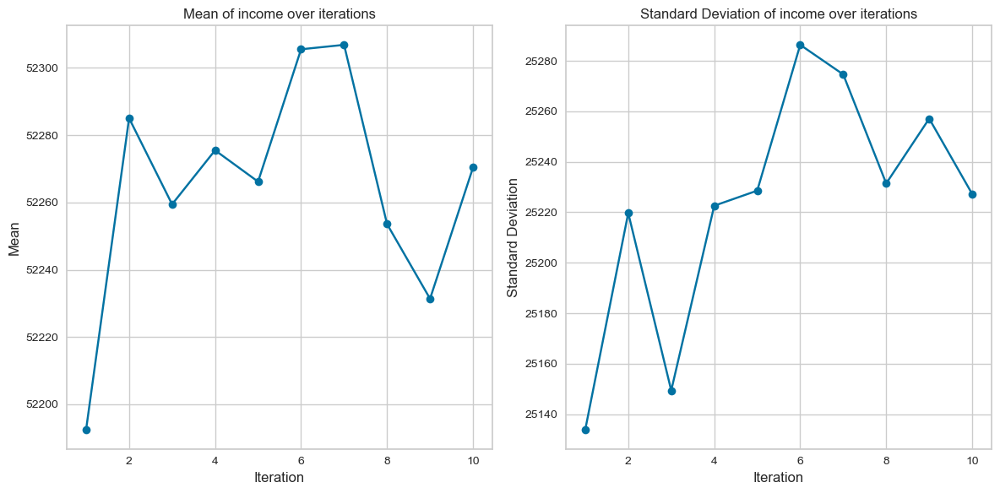

In [33]:
# Draw charts to check convergence
import matplotlib.pyplot as plt

income_means = []
income_stds = []

for iteration in range(10):
    df_imputed_iter = mice_kernel.complete_data(iteration=iteration)
    income_means.append(df_imputed_iter['Income'].mean())
    income_stds.append(df_imputed_iter['Income'].std())


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(1, 11), income_means, marker='o')
plt.title('Mean of income over iterations')
plt.xlabel('Iteration')
plt.ylabel('Mean')

plt.subplot(1, 2, 2)
plt.plot(range(1, 11), income_stds, marker='o')
plt.title('Standard Deviation of income over iterations')
plt.xlabel('Iteration')
plt.ylabel('Standard Deviation')

plt.tight_layout()
plt.show()

In [34]:
# Step 3: Retrieve the imputed data
df_imputed = mice_kernel.complete_data()

In [35]:
# Convert column 'Payment_Method' to identifier
df_imputed['Payment_Method'] = df_imputed['Payment_Method'].apply(lambda x: payment_method_categories[x])
# Convert 'income' values to integers if needed
df_imputed['Income'] = df_imputed['Income'].astype(int)

In [36]:
df_imputed.isna().sum()

ID                       0
Year_Of_Birth            0
Academic_Level           0
Income                   0
Registration_Time        0
Recency                  0
Liquor                   0
Vegetables               0
Pork                     0
Seafood                  0
Candy                    0
Jewellery                0
Num_Deals_Purchases      0
Num_Web_Purchases        0
Num_Catalog_Purchases    0
Num_Store_Purchases      0
Num_Web_Visits_Month     0
Promo_30                 0
Promo_40                 0
Promo_50                 0
Promo_10                 0
Promo_20                 0
Complain                 0
Gender                   0
Phone                    0
Year_Register            0
Month_Register           0
Total_Purchase           0
Living_With              0
Payment_Method           0
dtype: int64

In [37]:
df_deduplicated.Income = df_imputed.Income
df_deduplicated.Payment_Method = df_imputed.Payment_Method

In [38]:
df_deduplicated.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2240 entries, 831 to 1054
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     2240 non-null   int64         
 1   Year_Of_Birth          2240 non-null   float64       
 2   Academic_Level         2240 non-null   object        
 3   Income                 2240 non-null   int32         
 4   Registration_Time      2240 non-null   datetime64[ns]
 5   Recency                2240 non-null   float64       
 6   Liquor                 2240 non-null   float64       
 7   Vegetables             2240 non-null   float64       
 8   Pork                   2240 non-null   float64       
 9   Seafood                2240 non-null   float64       
 10  Candy                  2240 non-null   float64       
 11  Jewellery              2240 non-null   float64       
 12  Num_Deals_Purchases    2240 non-null   float64       
 13  N

In [39]:
df_deduplicated.to_excel('fill.xlsx',index = False)

#### Add, remove, and edit columns

In [40]:
# Split column Living_With into living_Status and Numver_of_Children
df_deduplicated[['Living_Status', 'Number_of_Children']] = df_deduplicated['Living_With'].str.split('_', expand=True)

In [41]:
# add column "Age"
currentYear = datetime.datetime.now()
df_deduplicated['Age'] = currentYear.year - df_deduplicated.Year_Of_Birth


In [42]:
df_deduplicated.columns

Index(['ID', 'Year_Of_Birth', 'Academic_Level', 'Income', 'Registration_Time',
       'Recency', 'Liquor', 'Vegetables', 'Pork', 'Seafood', 'Candy',
       'Jewellery', 'Num_Deals_Purchases', 'Num_Web_Purchases',
       'Num_Catalog_Purchases', 'Num_Store_Purchases', 'Num_Web_Visits_Month',
       'Promo_30', 'Promo_40', 'Promo_50', 'Promo_10', 'Promo_20', 'Complain',
       'Gender', 'Phone', 'Year_Register', 'Month_Register', 'Total_Purchase',
       'Living_With', 'Payment_Method', 'Living_Status', 'Number_of_Children',
       'Age'],
      dtype='object')

In [43]:
# add column frequency
from datetime import datetime
# June 1, 2024
current_date = datetime(2024, 6, 1)

In [44]:
date_duration = current_date - df_deduplicated.Registration_Time

In [45]:
date_duration = date_duration.dt.days.astype('int')

In [46]:
df_deduplicated['frequency'] = df_deduplicated.Total_Purchase/date_duration

In [47]:
df_deduplicated.frequency

831     0.030422
1132    0.029745
301     0.049632
1101    0.007919
2888    0.033571
          ...   
110     0.009972
1920    0.019157
2315    0.045662
1903    0.025261
1054    0.038536
Name: frequency, Length: 2240, dtype: float64

In [48]:
# Define age bins based on the distribution of working age in VietNam
bins = [0, 18, 30, 40, 50, 60, float('inf')]
labels = ['Under 18', '18 - 30', '31 - 40', '41 - 50', '51 - 60', 'Over 60']

# Create age bins
df_deduplicated['Age_Group'] = pd.cut(df_deduplicated['Age'], bins=bins, labels=labels, right=False)

In [49]:
# Add column "Total_Expenditure"
df_deduplicated['Total_Expenditure'] =df_deduplicated.Liquor + df_deduplicated.Vegetables + df_deduplicated.Pork +df_deduplicated.Seafood+df_deduplicated.Candy+df_deduplicated.Jewellery

In [50]:
# Define income bins
income_bins = [0, 30000, 60000, 90000, float('inf')]
income_labels = ['< 30,000', '30,000 - 60,000', '60,000 - 90,000', '90,000+']

# Create income bins
df_deduplicated['Income_Group'] = pd.cut(df_deduplicated['Income'], bins=income_bins, labels=income_labels, right=False)

In [51]:
df_deduplicated.T

,831,1132,301,1101,2888,1948,16,729,2761,1221,...,530,635,841,2622,2213,110,1920,2315,1903,1054
ID,1001,1002,1005,1006,1007,1008,1017,1018,1022,1028,...,9963,9967,9970,9977,9979,9980,9985,9986,9990,9997
Year_Of_Birth,1994.0,1989.0,1978.0,1987.0,1996.0,1996.0,1994.0,1990.0,1985.0,1985.0,...,1988.0,1988.0,1987.0,1986.0,1992.0,1992.0,1986.0,1990.0,1993.0,1994.0
Academic_Level,Graduation,Graduation,2n Cycle,Master,PhD,PhD,Graduation,Graduation,Graduation,PhD,...,Graduation,Graduation,Master,Graduation,PhD,Graduation,Graduation,Graduation,Graduation,Graduation
Income,61074,60093,79689,41021,57333,75032,83715,31814,75693,40344,...,34600,36065,59354,34421,82032,22010,38361,56628,75330,56243
Registration_Time,2021-08-17 00:00:00,2022-06-26 00:00:00,2022-12-05 00:00:00,2021-12-30 00:00:00,2021-09-22 00:00:00,2022-04-28 00:00:00,2023-03-02 00:00:00,2022-09-02 00:00:00,2021-06-12 00:00:00,2022-10-13 00:00:00,...,2022-01-01 00:00:00,2022-03-31 00:00:00,2022-11-15 00:00:00,2022-01-07 00:00:00,2023-05-04 00:00:00,2022-06-30 00:00:00,2022-12-27 00:00:00,2023-03-21 00:00:00,2021-04-10 00:00:00,2022-12-30 00:00:00
Recency,37.0,92.0,65.0,12.0,55.0,74.0,2.0,73.0,10.0,48.0,...,8.0,54.0,53.0,81.0,54.0,51.0,74.0,30.0,94.0,26.0
Liquor,790.0,503.0,312.0,15.0,942.0,953.0,319.0,36.0,798.0,211.0,...,200.0,19.0,234.0,4.0,333.0,12.0,40.0,480.0,556.0,348.0
Vegetables,2.0,14.0,28.0,9.0,16.0,14.0,10.0,5.0,155.0,2.0,...,35.0,9.0,4.0,5.0,196.0,4.0,2.0,7.0,84.0,2.0
Pork,133.0,109.0,640.0,9.0,397.0,180.0,407.0,20.0,293.0,6.0,...,60.0,34.0,53.0,7.0,377.0,9.0,56.0,82.0,257.0,35.0
Seafood,0.0,16.0,180.0,6.0,76.0,47.0,150.0,4.0,72.0,0.0,...,8.0,10.0,3.0,6.0,149.0,3.0,20.0,7.0,93.0,4.0


#### check outlier

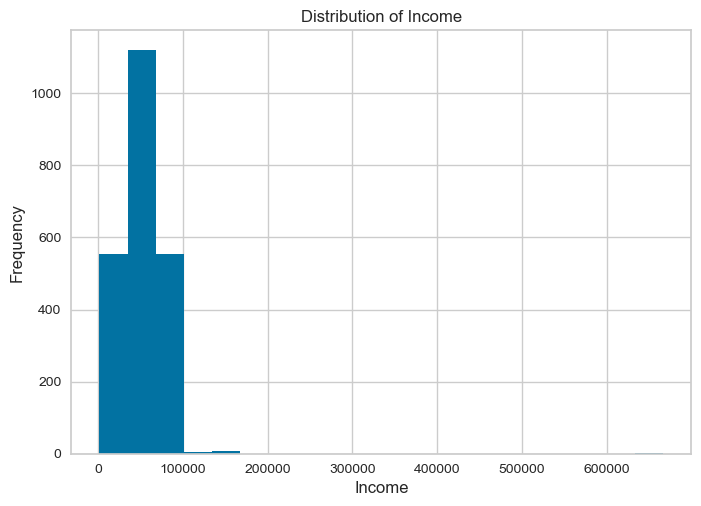

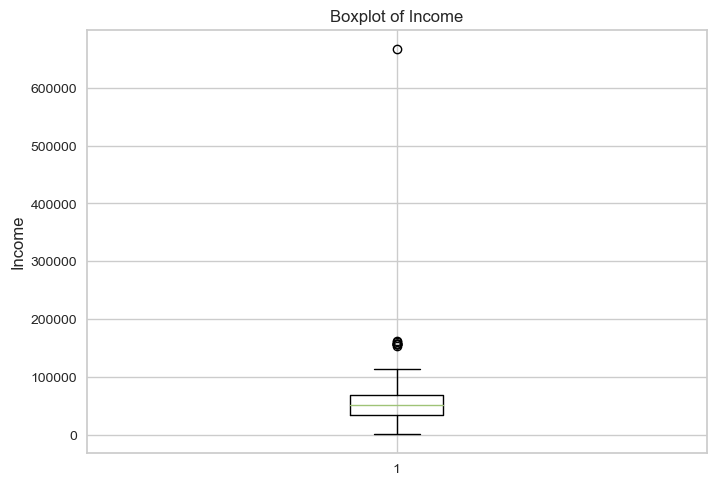

0.40178571428571425
Outliers have been removed because they constitute less than 5% of the data.


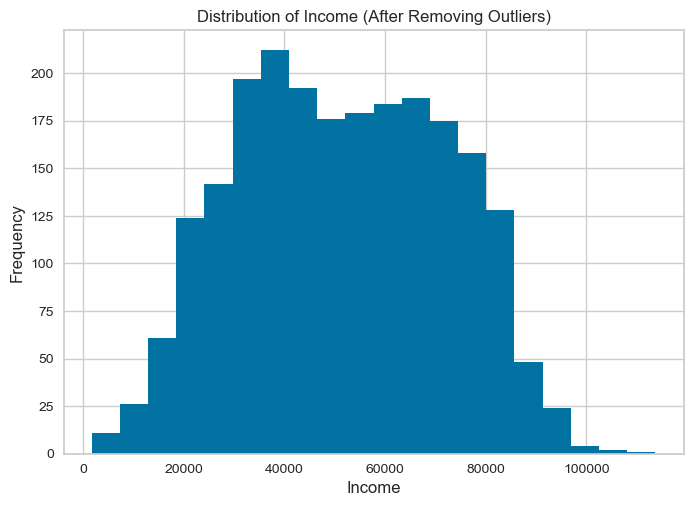

In [52]:
import pandas as pd
import matplotlib.pyplot as plt

# Assume df_deduplicated is your DataFrame

# Draw a histogram for a column to see the distribution
plt.hist(df_deduplicated['Income'], bins=20)
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.title('Distribution of Income')
plt.show()

# Use boxplot to see outliers
plt.boxplot(df_deduplicated['Income'])
plt.ylabel('Income')
plt.title('Boxplot of Income')
plt.show()

# Identify outliers using IQR
Q1 = df_deduplicated['Income'].quantile(0.25)
Q3 = df_deduplicated['Income'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Calculate the percentage of outliers
outliers_percentage = ((df_deduplicated['Income'] < lower_bound) | (df_deduplicated['Income'] > upper_bound)).mean() * 100
print(outliers_percentage)
if outliers_percentage < 5:
    # Remove outliers if they constitute less than 5% of the data
    df_deduplicated = df_deduplicated[(df_deduplicated['Income'] >= lower_bound) & (df_deduplicated['Income'] <= upper_bound)]
    print("Outliers have been removed because they constitute less than 5% of the data.")
else:
    print("Outliers have been kept because they constitute 5% or more of the data.")

# Recheck distribution after processing outliers
plt.hist(df_deduplicated['Income'], bins=20)
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.title('Distribution of Income (After Removing Outliers)')
plt.show()


#### So the data set is basically processed.

In [53]:
df_deduplicated.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2231 entries, 831 to 1054
Data columns (total 37 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     2231 non-null   int64         
 1   Year_Of_Birth          2231 non-null   float64       
 2   Academic_Level         2231 non-null   object        
 3   Income                 2231 non-null   int32         
 4   Registration_Time      2231 non-null   datetime64[ns]
 5   Recency                2231 non-null   float64       
 6   Liquor                 2231 non-null   float64       
 7   Vegetables             2231 non-null   float64       
 8   Pork                   2231 non-null   float64       
 9   Seafood                2231 non-null   float64       
 10  Candy                  2231 non-null   float64       
 11  Jewellery              2231 non-null   float64       
 12  Num_Deals_Purchases    2231 non-null   float64       
 13  N

In [54]:
df_deduplicated.isna().sum()

ID                       0
Year_Of_Birth            0
Academic_Level           0
Income                   0
Registration_Time        0
Recency                  0
Liquor                   0
Vegetables               0
Pork                     0
Seafood                  0
Candy                    0
Jewellery                0
Num_Deals_Purchases      0
Num_Web_Purchases        0
Num_Catalog_Purchases    0
Num_Store_Purchases      0
Num_Web_Visits_Month     0
Promo_30                 0
Promo_40                 0
Promo_50                 0
Promo_10                 0
Promo_20                 0
Complain                 0
Gender                   0
Phone                    0
Year_Register            0
Month_Register           0
Total_Purchase           0
Living_With              0
Payment_Method           0
Living_Status            0
Number_of_Children       0
Age                      0
frequency                0
Age_Group                0
Total_Expenditure        0
Income_Group             0
d

# EXPLORE DATA ANALYSIS (EDA)

In [55]:
df_deduplicated.to_csv('test.csv',index= False)

In [56]:
df_purchases = df_deduplicated[['Num_Web_Purchases',
       'Num_Catalog_Purchases', 'Num_Store_Purchases','Num_Deals_Purchases','Total_Purchase','Number_of_Children']]

In [57]:
df_purchases

,Num_Web_Purchases,Num_Catalog_Purchases,Num_Store_Purchases,Num_Deals_Purchases,Total_Purchase,Number_of_Children
831,11.0,5.0,8.0,7.0,31.0,1
1132,7.0,2.0,10.0,2.0,21.0,1
301,4.0,9.0,13.0,1.0,27.0,0
1101,2.0,0.0,3.0,2.0,7.0,1
2888,8.0,5.0,9.0,11.0,33.0,1
...,...,...,...,...,...,...
110,2.0,0.0,3.0,2.0,7.0,1
1920,3.0,1.0,3.0,3.0,10.0,1
2315,7.0,6.0,5.0,2.0,20.0,1
1903,10.0,3.0,12.0,4.0,29.0,2


In [58]:
df_agegroup = df_deduplicated[['Age_Group','Income','Total_Expenditure']]

In [59]:
df_agegroup

,Age_Group,Income,Total_Expenditure
831,31 - 40,61074,1105.0
1132,31 - 40,60093,738.0
301,41 - 50,79689,1318.0
1101,31 - 40,41021,67.0
2888,18 - 30,57333,1665.0
...,...,...,...
110,31 - 40,22010,36.0
1920,31 - 40,38361,140.0
2315,31 - 40,56628,764.0
1903,31 - 40,75330,1112.0


C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\1693026413.py:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  average_vs_age_group = sns.barplot(x="Age_Group", y="Average", hue="Variable", data=melted_data, ci=None)


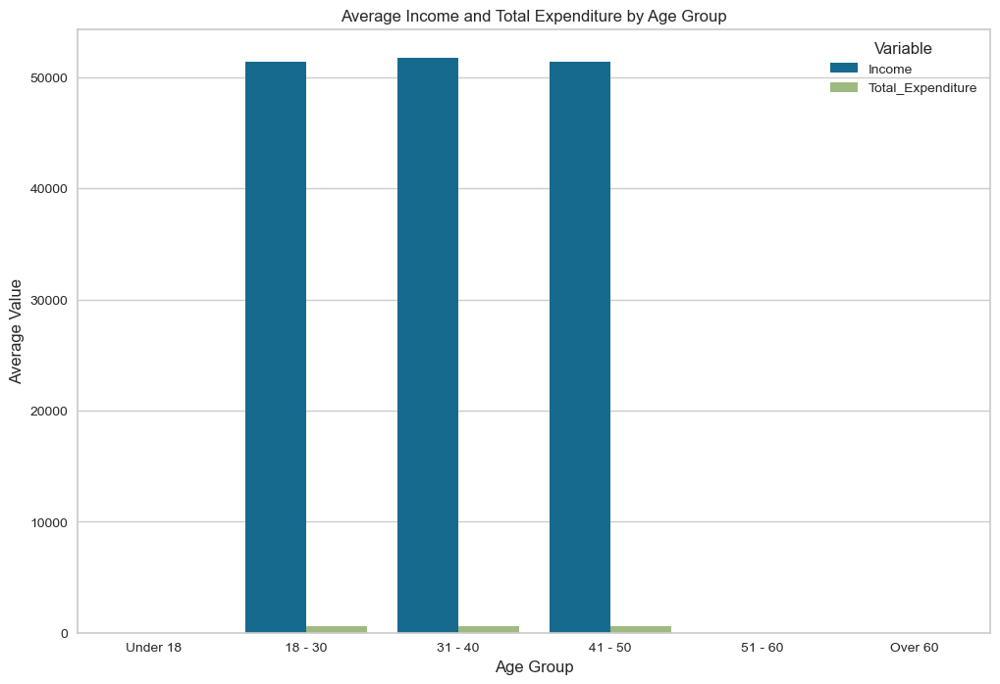

In [60]:
# Group by Age_Group and calculate the mean income and mean total expenditure
average_data_by_age_group = df_agegroup.groupby('Age_Group')[['Income', 'Total_Expenditure']].mean().reset_index()

# Melt the DataFrame to have 'Income' and 'Total_Expenditure' in the same column for visualization
melted_data = average_data_by_age_group.melt(id_vars='Age_Group', var_name='Variable', value_name='Average')

# Create a bar plot
plt.figure(figsize=(12, 8))
average_vs_age_group = sns.barplot(x="Age_Group", y="Average", hue="Variable", data=melted_data, ci=None)

# Set plot titles and labels
average_vs_age_group.set(title='Average Income and Total Expenditure by Age Group')
average_vs_age_group.set_xlabel("Age Group")
average_vs_age_group.set_ylabel("Average Value")

# Show plot
plt.show()

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\147349914.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Age_Group", y="Income", data=average_data_by_age_group, ax=axes[0], ci=None)
C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\147349914.py:17: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Age_Group", y="Total_Expenditure", data=average_data_by_age_group, ax=axes[1], ci=None)


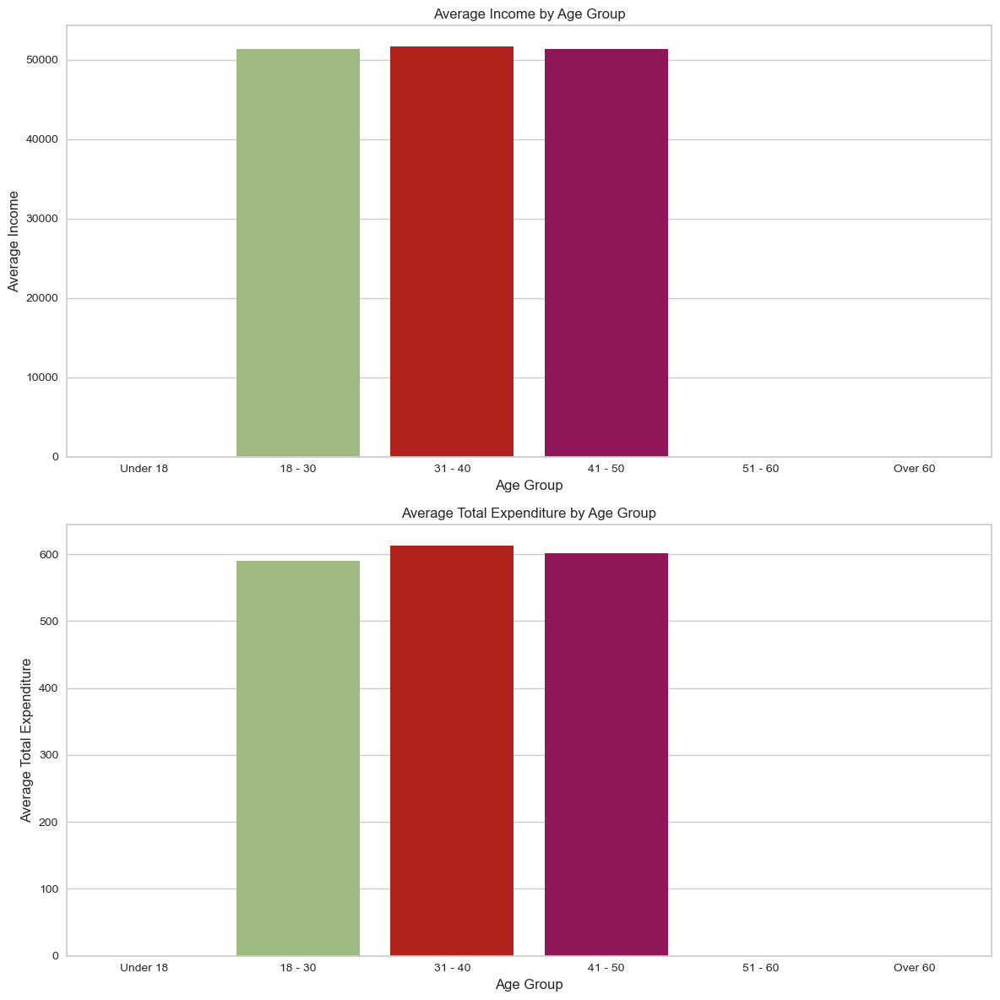

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by Age_Group and calculate the mean income and mean total expenditure
average_data_by_age_group = df_agegroup.groupby('Age_Group')[['Income', 'Total_Expenditure']].mean().reset_index()

# Create two subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 12))

# Plot for Average Income
sns.barplot(x="Age_Group", y="Income", data=average_data_by_age_group, ax=axes[0], ci=None)
axes[0].set_title('Average Income by Age Group')
axes[0].set_xlabel('Age Group')
axes[0].set_ylabel('Average Income')

# Plot for Average Total Expenditure
sns.barplot(x="Age_Group", y="Total_Expenditure", data=average_data_by_age_group, ax=axes[1], ci=None)
axes[1].set_title('Average Total Expenditure by Age Group')
axes[1].set_xlabel('Age Group')
axes[1].set_ylabel('Average Total Expenditure')

# Adjust layout
plt.tight_layout()

# Show plots
plt.show()

Age groups have relatively similar average income and expenditure.

Among them, the age group 30 - 40 has the highest input and output.

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\1232557071.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_purchases['Purchase_Bin'] = pd.cut(df_purchases['Total_Purchase'], bins=bins, labels=labels)
C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\1232557071.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped = df_purchases.groupby('Purchase_Bin').mean()


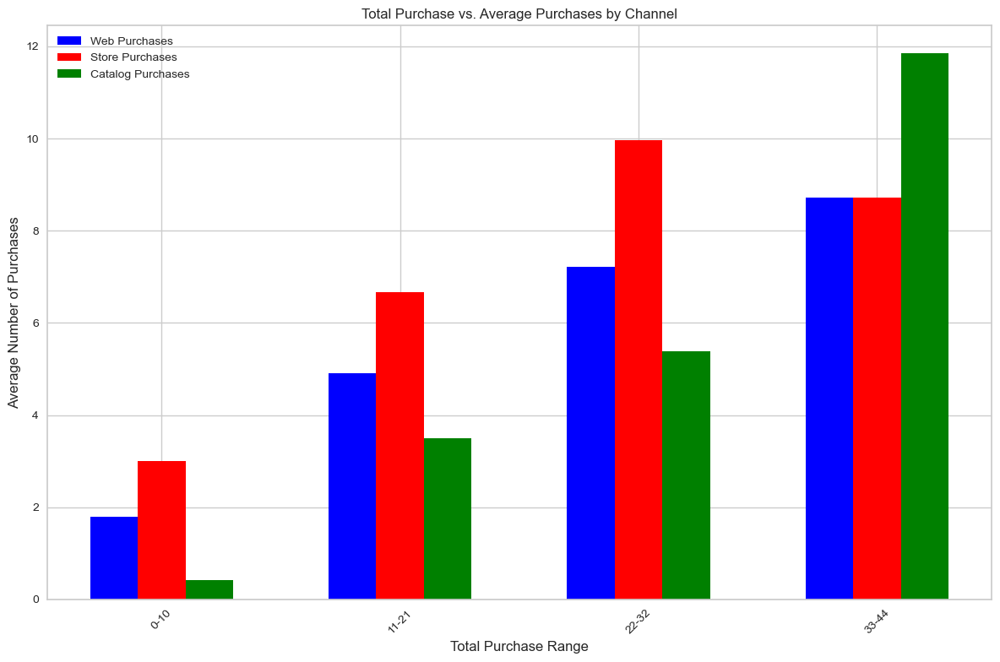

In [62]:
# Define the bins and labels for Total_Purchase
bins = [0, 11, 22, 33, 45]
labels = ['0-10', '11-21', '22-32', '33-44']

# Create a new column for the Total_Purchase bins
df_purchases['Purchase_Bin'] = pd.cut(df_purchases['Total_Purchase'], bins=bins, labels=labels)

# Group by the Purchase_Bin and calculate the mean
grouped = df_purchases.groupby('Purchase_Bin').mean()

# Define the positions and width for the bars
bar_width = 0.2
positions = np.arange(len(grouped))

# Create the bar plots
plt.figure(figsize=(12, 8))

# Web Purchases
plt.bar(positions - bar_width, grouped['Num_Web_Purchases'], width=bar_width, color='blue', label='Web Purchases')

# Store Purchases
plt.bar(positions, grouped['Num_Store_Purchases'], width=bar_width, color='red', label='Store Purchases')

# Catalog Purchases
plt.bar(positions + bar_width, grouped['Num_Catalog_Purchases'], width=bar_width, color='green', label='Catalog Purchases')

# Add labels and title
plt.xlabel('Total Purchase Range')
plt.ylabel('Average Number of Purchases')
plt.title('Total Purchase vs. Average Purchases by Channel')
plt.xticks(positions, labels, rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()

The majority of customers buy through stores regardless of whether their transactions are large or small
Customers with the highest total number of transactions (40 - 44 transactions) buy the most through catalogs

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\1951399701.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped = df_purchases.groupby('Number_of_Children').mean()


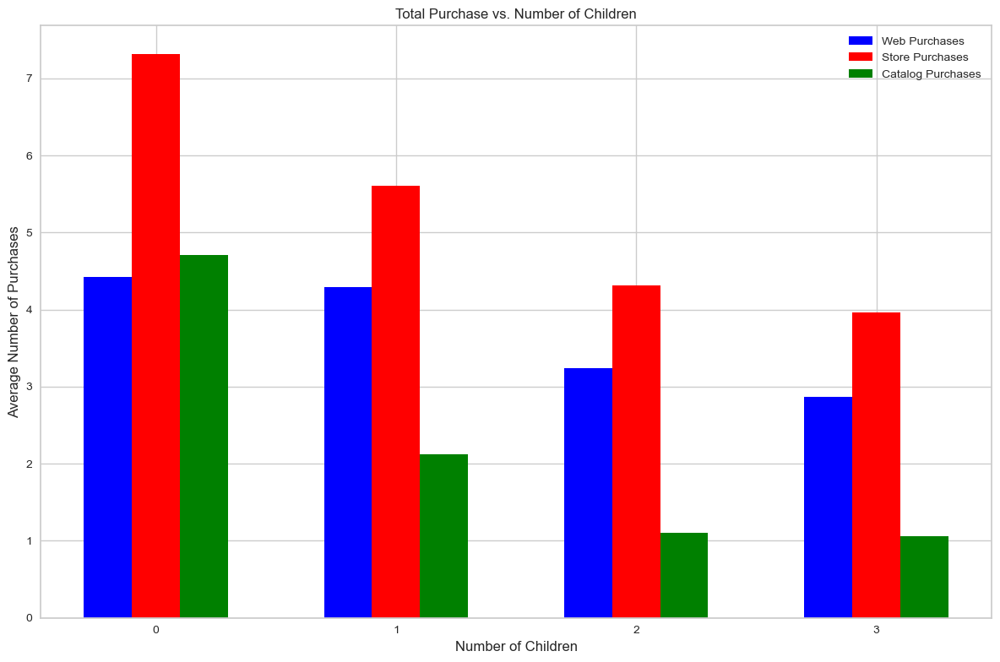

In [63]:


# Group by the Purchase_Bin and calculate the mean
grouped = df_purchases.groupby('Number_of_Children').mean()

# Define the positions and width for the bars
bar_width = 0.2
positions = np.arange(len(grouped))

# Create the bar plots
plt.figure(figsize=(12, 8))

# Web Purchases
plt.bar(positions - bar_width, grouped['Num_Web_Purchases'], width=bar_width, color='blue', label='Web Purchases')

# Store Purchases
plt.bar(positions, grouped['Num_Store_Purchases'], width=bar_width, color='red', label='Store Purchases')

# Catalog Purchases
plt.bar(positions + bar_width, grouped['Num_Catalog_Purchases'], width=bar_width, color='green', label='Catalog Purchases')

# Add labels and title
plt.xlabel('Number of Children')
plt.ylabel('Average Number of Purchases')
plt.title('Total Purchase vs. Number of Children')
plt.xticks(positions, df_purchases.Number_of_Children.unique().sort(), rotation=0)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()

Childless and large customers buy more through the store.
However, childless families buy more through catalogs than large families.

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\132794801.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped = df_deduplicated.groupby('Income_Group').mean()


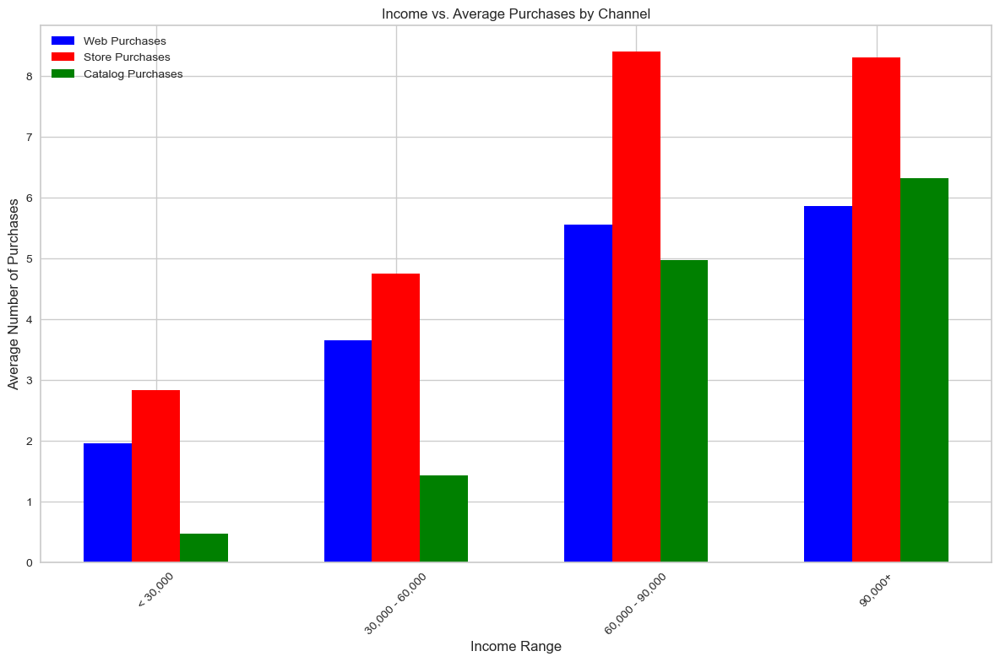

In [64]:
# Group data by income ranges
grouped = df_deduplicated.groupby('Income_Group').mean()

# Define the positions and width for the bars
bar_width = 0.2
positions = np.arange(len(grouped))

# Create the bar plots
plt.figure(figsize=(12, 8))

# Web Purchases
plt.bar(positions - bar_width, grouped['Num_Web_Purchases'], width=bar_width, color='blue', label='Web Purchases')

# Store Purchases
plt.bar(positions, grouped['Num_Store_Purchases'], width=bar_width, color='red', label='Store Purchases')

# Catalog Purchases
plt.bar(positions + bar_width, grouped['Num_Catalog_Purchases'], width=bar_width, color='green', label='Catalog Purchases')

# Add labels and title
plt.xlabel('Income Range')
plt.ylabel('Average Number of Purchases')
plt.title('Income vs. Average Purchases by Channel')
plt.xticks(positions, income_labels, rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()

Whether high or low income, customers still buy more products through stores than through the web and catalogs.
The more income increases, the more customers tend to buy through catalogs.

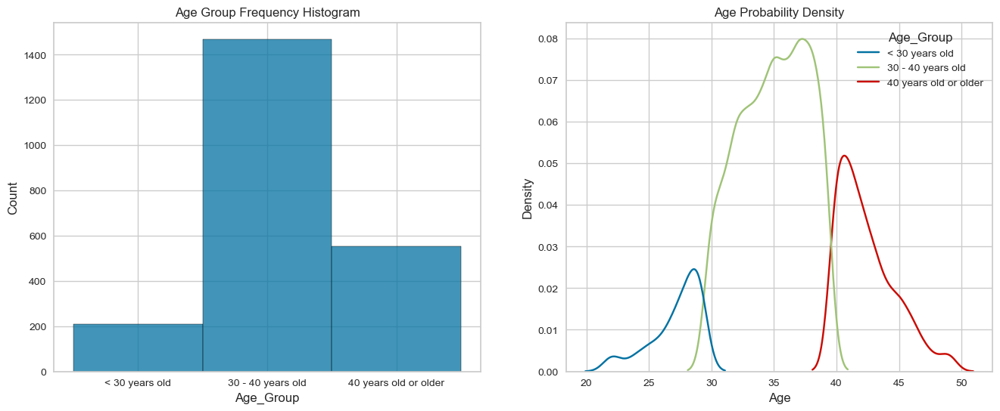

In [65]:
bins = [0, 30, 40, float('inf')]
labels = ['< 30 years old', '30 - 40 years old', '40 years old or older']

# Create age bins
df_deduplicated['Age_Group'] = pd.cut(df_deduplicated['Age'], bins=bins, labels=labels, right=False)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.histplot(df_deduplicated['Age_Group'], ax=axes[0], discrete=True).set(title='Age Group Frequency Histogram')
sns.kdeplot(data=df_deduplicated, x='Age', hue='Age_Group', ax=axes[1]).set(title='Age Probability Density')
plt.show()

The company's customer group ranges in age from about 20 - 50 years old.

In particular, the customer group is mainly concentrated in the age of 30 - 40.

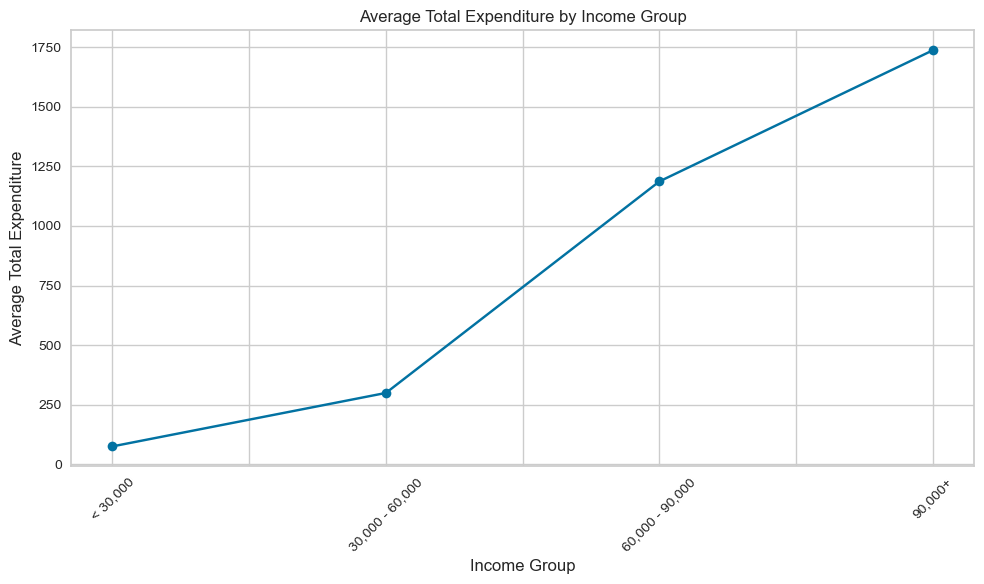

In [66]:
# Copy DataFrame
df_Income = df_deduplicated.copy()

# Divide income into 5 groups
df_Income['Income_Group'] = pd.cut(df_Income['Income'], bins=income_bins, labels=income_labels, right=False)

# Calculate the average total expenditure for each income group
grouped_data = df_Income.groupby('Income_Group')['Total_Expenditure'].mean()

# Draw a line plot chart
plt.figure(figsize=(10, 6))
grouped_data.plot(marker='o')
plt.title('Average Total Expenditure by Income Group')
plt.xlabel('Income Group')
plt.ylabel('Average Total Expenditure')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

The higher the income,
Spend more.

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\3838321654.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  agg_data = df_deduplicated.groupby('Academic_Level').mean().reset_index()


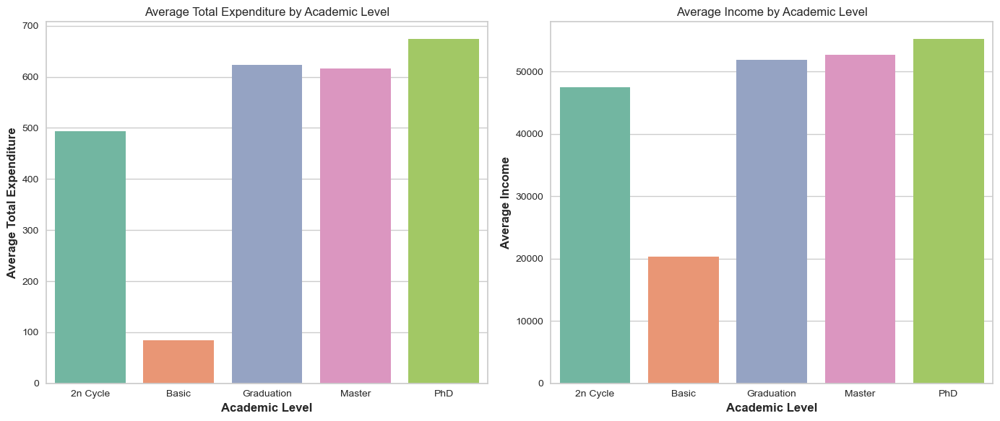

In [67]:
# Aggregate data by Academic_Level
agg_data = df_deduplicated.groupby('Academic_Level').mean().reset_index()
# Set up the figure
plt.figure(figsize=(14, 6))

# Bar plot for Total Expenditure
plt.subplot(1, 2, 1)
sns.barplot(x='Academic_Level', y='Total_Expenditure', data=agg_data, palette='Set2')
plt.xlabel('Academic Level', fontweight='bold')
plt.ylabel('Average Total Expenditure', fontweight='bold')
plt.title('Average Total Expenditure by Academic Level')

# Bar plot for Income
plt.subplot(1, 2, 2)
sns.barplot(x='Academic_Level', y='Income', data=agg_data, palette='Set2')
plt.xlabel('Academic Level', fontweight='bold')
plt.ylabel('Average Income', fontweight='bold')
plt.title('Average Income by Academic Level')

# Show plot
plt.tight_layout()
plt.show()

The average income and expenditure levels of low-educated groups (basic groups) are lower than those of higher-educated groups.

The ratio of expenditure to income decreases with education level: The chart shows that the group of people with low levels of education has a higher ratio of spending to income than groups with higher levels of education.

<Axes: title={'center': 'Income vs Expenditure based on Number of Children'}, xlabel='Income', ylabel='Total_Expenditure'>

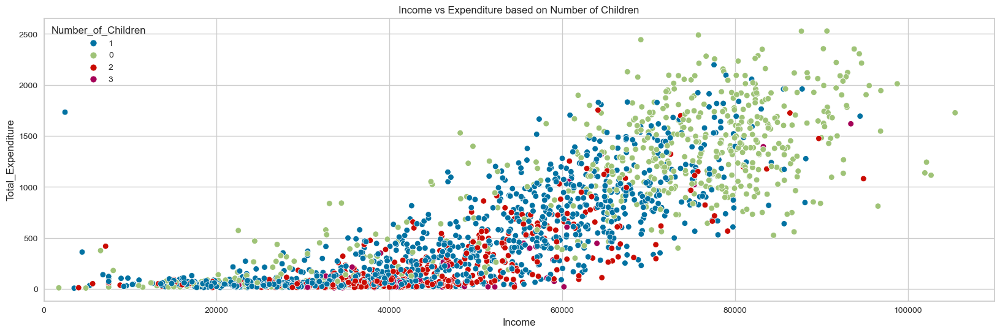

In [68]:
plt.figure(figsize=(20,6))
edu_vs_numberofchildren = sns.scatterplot(x="Income", y= "Total_Expenditure", data=df_deduplicated, hue="Number_of_Children")
edu_vs_numberofchildren.set(xlim=(0, 110000), title="Income vs Expenditure based on Number of Children")
edu_vs_numberofchildren

The average income and expenses of families without children are higher than those of families with many children

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\3608505081.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  agg_data = df_deduplicated.groupby('Number_of_Children').mean().reset_index()


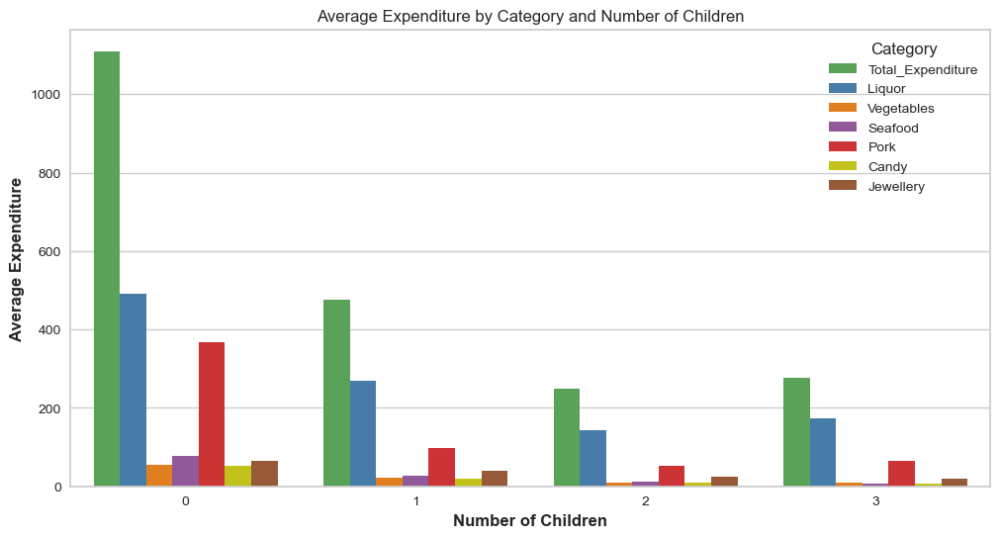

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
# Aggregate data by Number_of_Children
agg_data = df_deduplicated.groupby('Number_of_Children').mean().reset_index()

# Data for plotting
categories = ['Total_Expenditure', 'Liquor', 'Vegetables', 'Seafood','Pork','Candy','Jewellery']
agg_data_melted = agg_data.melt(id_vars='Number_of_Children', value_vars=categories,
                                var_name='Category', value_name='Expenditure')
# Custom color palette
custom_palette = ['#4daf4a', '#377eb8', '#ff7f00', '#984ea3', '#e41a1c', '#dede00', '#a65628']
# Plotting the clustered bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='Number_of_Children', y='Expenditure', hue='Category', data=agg_data_melted,palette=custom_palette)

# Adding labels and title
plt.xlabel('Number of Children', fontweight='bold')
plt.ylabel('Average Expenditure', fontweight='bold')
plt.title('Average Expenditure by Category and Number of Children')
plt.legend(title='Category')

# Show plot
plt.show()

Childless households and individuals consume more than households with children, especially in alcohol.

Large families spend more money on food: meat, fish, vegetables instead of alcohol

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_10104\4039281127.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  agg_data = df_deduplicated.groupby('Number_of_Children').sum().reset_index()


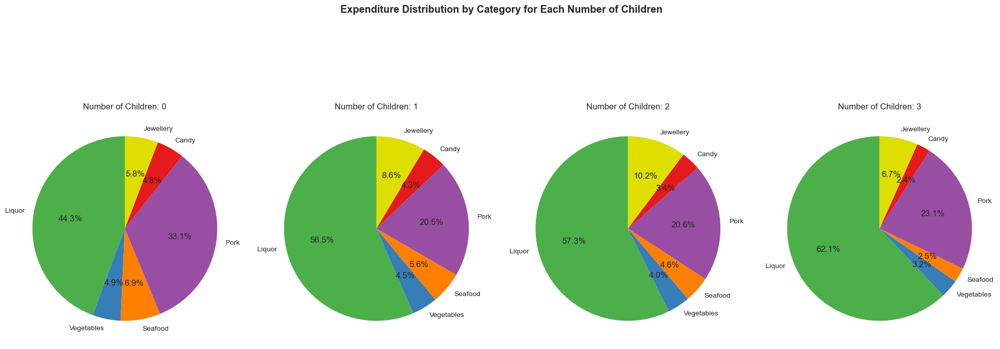

In [70]:
# Aggregate data by Number_of_Children
agg_data = df_deduplicated.groupby('Number_of_Children').sum().reset_index()

# Calculate the percentage of each category expenditure relative to total expenditure
categories = ['Liquor', 'Vegetables', 'Seafood', 'Pork', 'Candy', 'Jewellery']
for category in categories:
    agg_data[category + '_Percentage'] = (agg_data[category] / agg_data['Total_Expenditure']) * 100

# Set up the figure and axes
num_children = agg_data['Number_of_Children'].nunique()
fig, axes = plt.subplots(1, num_children, figsize=(20, 8))

# Custom color palette
custom_palette = ['#4daf4a', '#377eb8', '#ff7f00', '#984ea3', '#e41a1c', '#dede00']

# Plot pie charts
for i, (ax, (num_children, row)) in enumerate(zip(axes, agg_data.iterrows())):
    data = [row[category + '_Percentage'] for category in categories]
    ax.pie(data, labels=categories, autopct='%1.1f%%', startangle=90, colors=custom_palette)
    ax.set_title(f'Number of Children: {num_children}')

# Adjust layout
plt.tight_layout()
plt.suptitle('Expenditure Distribution by Category for Each Number of Children', y=1.05, fontweight='bold')

# Show plot
plt.show()

Households all spend the majority of alcohol in total spending.
Spending on sweets by the 4 groups all accounted for the least percentage.

The groups with children tended to spend more jewelry out of the total expenditure than the group without children.

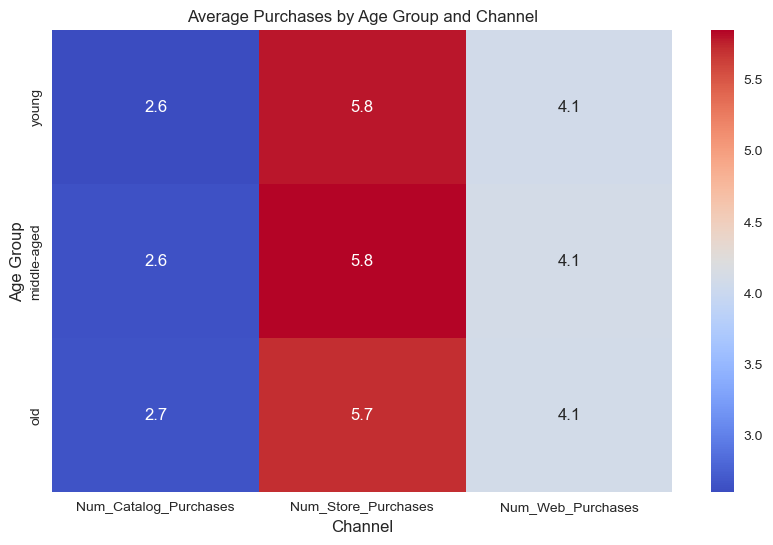

In [71]:
# Assume df_deduplicated is a DataFrame containing data
# Group Age into 3 parts: young, middle-aged, old
df_aged = df_deduplicated.copy()
df_aged['Age_Group'] = pd.cut(df_aged['Age'], bins=3, labels=['young', 'middle-aged', 'old'])

# Create a pivot table to calculate the average number of purchases by each channel and age segment
pivot_table = df_aged.pivot_table(index='Age_Group', values=['Num_Web_Purchases', 'Num_Store_Purchases', 'Num_Catalog_Purchases'], aggfunc='mean')

# Draw a rectangular chart
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm')
plt.title('Average Purchases by Age Group and Channel')
plt.xlabel('Channel')
plt.ylabel('Age Group')
plt.show()

Regardless of age, customers still buy the most products through stores

# A/B TESTING

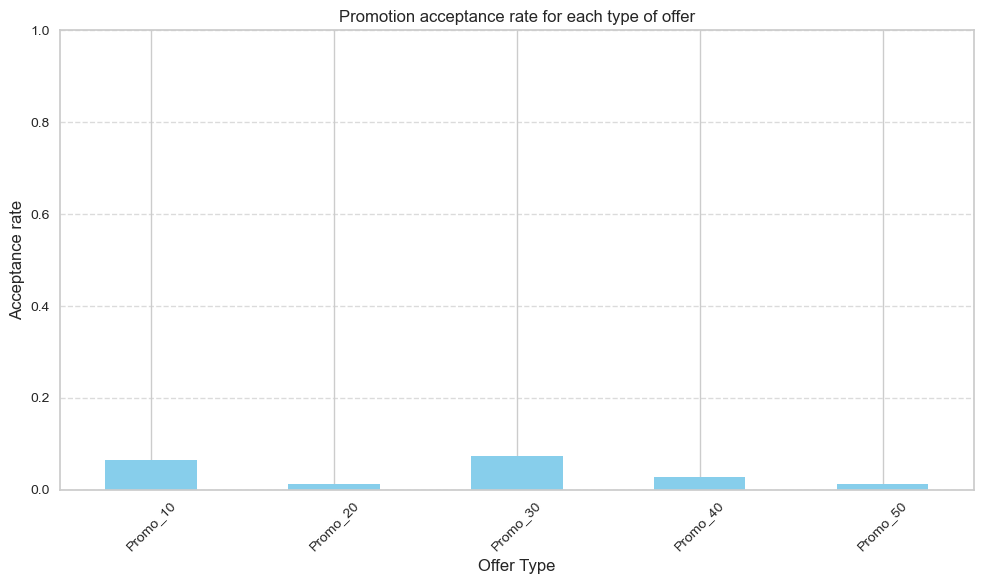

In [72]:
# Calculate the promotion acceptance rate for each offer type
df_promotion = pd.concat([df_deduplicated.Promo_10, 
                          df_deduplicated.Promo_20, 
                          df_deduplicated.Promo_30, 
                          df_deduplicated.Promo_40,
                         df_deduplicated.Promo_50], axis=1)
acceptance_rates = df_promotion.mean()

# Draw a column chart
plt.figure(figsize=(10, 6))
acceptance_rates.plot(kind='bar', color='skyblue')
plt.title('Promotion acceptance rate for each type of offer')
plt.xlabel('Offer Type')
plt.ylabel('Acceptance rate')
plt.xticks(rotation=45)
plt.ylim(0, 1) # Make sure the y-axis is between 0 and 1
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

To conduct an A/B test comparing the effectiveness of Promo_10 and Promo_30 on the number of deals purchases (Num_Deals_Purchases), we use a statistical test such as the two-sample t-test for means. This will help us determine if there is a significant difference between the two promotion groups. We'll set up the test as follows:

Null Hypothesis (H0): The mean number of deals purchases with Promo_30 is less than or equal to that with Promo_10.

Alternative Hypothesis (H1): The mean number of deals purchases with Promo_30 is more than that with Promo_10.

In [73]:
import pandas as pd
from scipy.stats import ttest_ind
from statsmodels.stats.power import TTestIndPower

In [74]:
def promo_effectiveness_analysis(df, promo_1, promo_2, alpha=0.05, power=0.8):
    # Filter the data for promo_1 and promo_2
    promo_1_purchases = df[df[promo_1] == 1]['Num_Deals_Purchases']
    promo_2_purchases = df[df[promo_2] == 1]['Num_Deals_Purchases']
    
    # Ensure we have data for both promotions
    if promo_1_purchases.empty or promo_2_purchases.empty:
        print('Not enough data for one or both promotions.')
        return None

    # Calculate the effect size
    effect_size = (promo_2_purchases.mean() - promo_1_purchases.mean()) / df['Num_Deals_Purchases'].std()
    
    # Check if the effect size is zero
    if effect_size == 0:
        print('Cannot detect an effect-size of 0. Try changing your effect-size.')
        return None

    # Perform power analysis to determine sample size
    analysis = TTestIndPower()
    sample_size = analysis.solve_power(effect_size=effect_size, alpha=alpha, power=power, alternative='larger')
    sample_size = int(sample_size)

    # Ensure that we have enough samples
    if len(promo_1_purchases) < sample_size or len(promo_2_purchases) < sample_size:
        print(f'Not enough data. Each group needs at least {sample_size} samples.')
        return None

    # Perform two-sample t-test
    t_stat, p_value = ttest_ind(promo_2_purchases, promo_1_purchases, alternative='greater')
    
    # Calculate the achieved power
    actual_power = analysis.power(effect_size=effect_size, nobs1=len(promo_2_purchases), alpha=alpha, alternative='larger')

    # Interpret the result
    if p_value < alpha:
        result = "Reject the null hypothesis. {} is more effective than {}.".format(promo_2, promo_1)
    else:
        result = "Fail to reject the null hypothesis. {} is not more effective than {}.".format(promo_2, promo_1)

    return {
        'Effect Size': effect_size,
        'Required Sample Size per Group': sample_size,
        'T-statistic': t_stat,
        'P-value': p_value,
        'Achieved Power': actual_power,
        'Result': result
    }

In [75]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_10', 'Promo_30')
result

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\scipy\stats\_continuous_distns.py:6832: RuntimeWarning: invalid value encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)


{'Effect Size': 0.395367497200232,
 'Required Sample Size per Group': 79,
 'T-statistic': 4.4070385911649215,
 'P-value': 7.266039012321551e-06,
 'Achieved Power': 0.9723780417865389,
 'Result': 'Reject the null hypothesis. Promo_30 is more effective than Promo_10.'}

Null Hypothesis (H0): The mean number of deals purchases with Promo_20 is less than or equal to that with Promo_40.

Alternative Hypothesis (H1): The mean number of deals purchases with Promo_20 is more than that with Promo_40.

In [76]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_40', 'Promo_20')
result

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\statsmodels\stats\power.py:415: ConvergenceWarning: 
Failed to converge on a solution.

  warnings.warn(convergence_doc, ConvergenceWarning)


{'Effect Size': -0.13322593108972425,
 'Required Sample Size per Group': 10,
 'T-statistic': -0.806378551348036,
 'P-value': 0.7889365043408818,
 'Achieved Power': 0.015586161367701327,
 'Result': 'Fail to reject the null hypothesis. Promo_20 is not more effective than Promo_40.'}

Null Hypothesis (H0): The mean number of deals purchases with Promo_40 is less than or equal to that with Promo_30.

Alternative Hypothesis (H1): The mean number of deals purchases with Promo_40 is more than that with Promo_30.

In [77]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_30', 'Promo_40')
result

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\scipy\stats\_continuous_distns.py:6832: RuntimeWarning: invalid value encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\statsmodels\stats\power.py:415: ConvergenceWarning: 
Failed to converge on a solution.

  warnings.warn(convergence_doc, ConvergenceWarning)


{'Effect Size': -0.1125766057361948,
 'Required Sample Size per Group': 10,
 'T-statistic': -0.9477287282933866,
 'P-value': 0.8278555691732844,
 'Achieved Power': 0.011505397252958384,
 'Result': 'Fail to reject the null hypothesis. Promo_40 is not more effective than Promo_30.'}

Null Hypothesis (H0): The mean number of deals purchases with Promo_20 is less than or equal to that with Promo_10.

Alternative Hypothesis (H1): The mean number of deals purchases with Promo_20 is more than that with Promo_10.

In [78]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_20', 'Promo_10')
result

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\statsmodels\stats\power.py:415: ConvergenceWarning: 
Failed to converge on a solution.

  warnings.warn(convergence_doc, ConvergenceWarning)


{'Effect Size': -0.149564960374313,
 'Required Sample Size per Group': 10,
 'T-statistic': -1.0051646665043614,
 'P-value': 0.8418852225151019,
 'Achieved Power': 0.0018016010157216465,
 'Result': 'Fail to reject the null hypothesis. Promo_10 is not more effective than Promo_20.'}

Null Hypothesis (H0): The mean number of deals purchases with Promo_20 is less than or equal to that with Promo_40.

Alternative Hypothesis (H1): The mean number of deals purchases with Promo_20 is more than that with Promo_40.

In [79]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_40', 'Promo_10')
result

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\statsmodels\stats\power.py:415: ConvergenceWarning: 
Failed to converge on a solution.

  warnings.warn(convergence_doc, ConvergenceWarning)


{'Effect Size': -0.28279089146403724,
 'Required Sample Size per Group': 10,
 'T-statistic': -2.6053517001671462,
 'P-value': 0.9950745905076028,
 'Achieved Power': 2.6867452646683887e-05,
 'Result': 'Fail to reject the null hypothesis. Promo_10 is not more effective than Promo_40.'}

In [80]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_50', 'Promo_10')
result

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\statsmodels\stats\power.py:415: ConvergenceWarning: 
Failed to converge on a solution.

  warnings.warn(convergence_doc, ConvergenceWarning)


{'Effect Size': -0.149564960374313,
 'Required Sample Size per Group': 10,
 'T-statistic': -1.0051646665043614,
 'P-value': 0.8418852225151019,
 'Achieved Power': 0.0018016010157216465,
 'Result': 'Fail to reject the null hypothesis. Promo_10 is not more effective than Promo_50.'}

In [81]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_20', 'Promo_50')
result

Cannot detect an effect-size of 0. Try changing your effect-size.


In [82]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_30', 'Promo_50')
result

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\statsmodels\stats\power.py:415: ConvergenceWarning: 
Failed to converge on a solution.

  warnings.warn(convergence_doc, ConvergenceWarning)


{'Effect Size': -0.24580253682591904,
 'Required Sample Size per Group': 10,
 'T-statistic': -1.4865470154673732,
 'P-value': 0.9306083332634364,
 'Achieved Power': 0.004856934113484151,
 'Result': 'Fail to reject the null hypothesis. Promo_50 is not more effective than Promo_30.'}

In [83]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_40', 'Promo_50')
result

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\statsmodels\stats\power.py:415: ConvergenceWarning: 
Failed to converge on a solution.

  warnings.warn(convergence_doc, ConvergenceWarning)


{'Effect Size': -0.13322593108972425,
 'Required Sample Size per Group': 10,
 'T-statistic': -0.806378551348036,
 'P-value': 0.7889365043408818,
 'Achieved Power': 0.015586161367701327,
 'Result': 'Fail to reject the null hypothesis. Promo_50 is not more effective than Promo_40.'}

In [84]:
result = promo_effectiveness_analysis(df_deduplicated, 'Promo_30', 'Promo_20')
result

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\statsmodels\stats\power.py:415: ConvergenceWarning: 
Failed to converge on a solution.

  warnings.warn(convergence_doc, ConvergenceWarning)


{'Effect Size': -0.24580253682591904,
 'Required Sample Size per Group': 10,
 'T-statistic': -1.4865470154673732,
 'P-value': 0.9306083332634364,
 'Achieved Power': 0.004856934113484151,
 'Result': 'Fail to reject the null hypothesis. Promo_20 is not more effective than Promo_30.'}

# COMPARE CLUSTERING MODEL

In [85]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

In [86]:
df_clustermean = df_deduplicated.copy()


### **1.Determine k-Cluster**

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it 

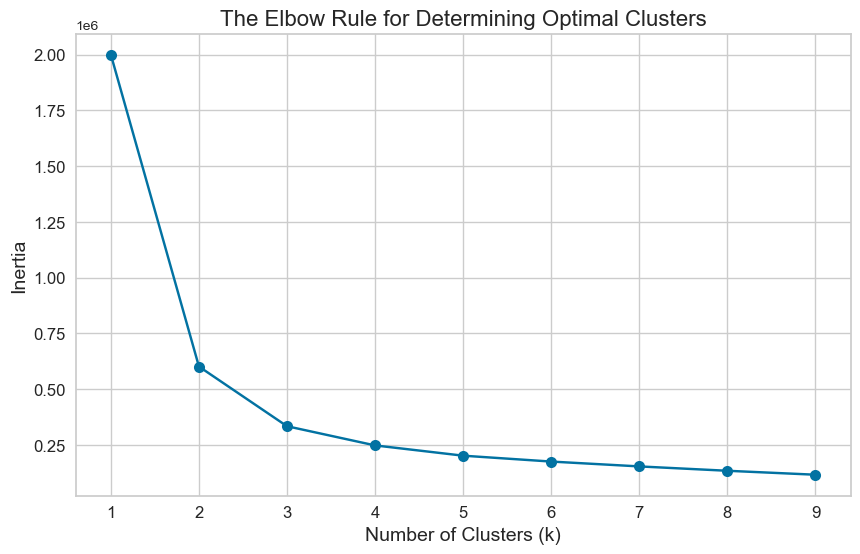

In [87]:
# Applying the Elbow method
inertias = []
possible_k_values = range(1, 10)
features = ['Recency', 'frequency', 'Total_Purchase']

for k in possible_k_values:
    model = KMeans(n_clusters=k, random_state=20, init='k-means++').fit(df_deduplicated[features])
    inertias.append(model.inertia_)

# Plotting the results
plt.figure(figsize=(10, 6))  # Larger figure for better readability
plt.plot(possible_k_values, inertias, 'bo-', markersize=8)  # Add markers to the plot line
plt.title("The Elbow Rule for Determining Optimal Clusters", fontsize=16)
plt.xlabel('Number of Clusters (k)', fontsize=14)
plt.ylabel('Inertia', fontsize=14)
plt.xticks(possible_k_values, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)  # Add grid lines for better readability
plt.show()

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it 

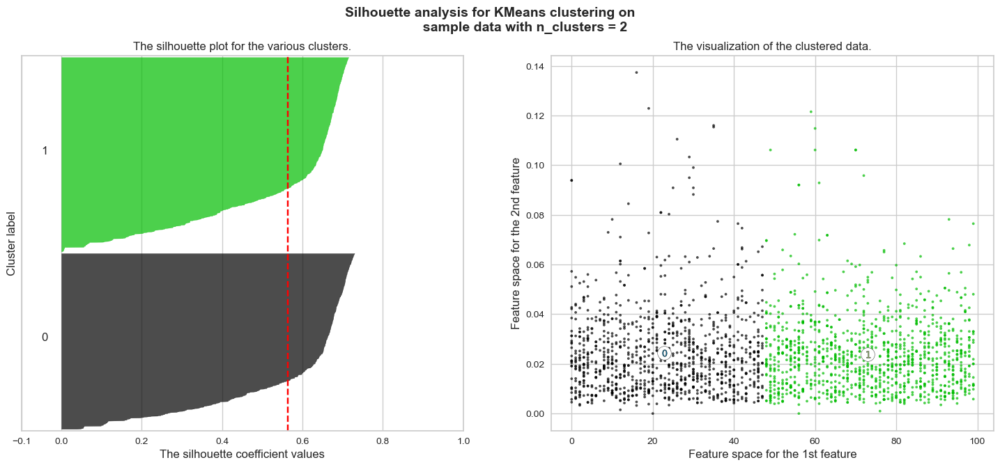

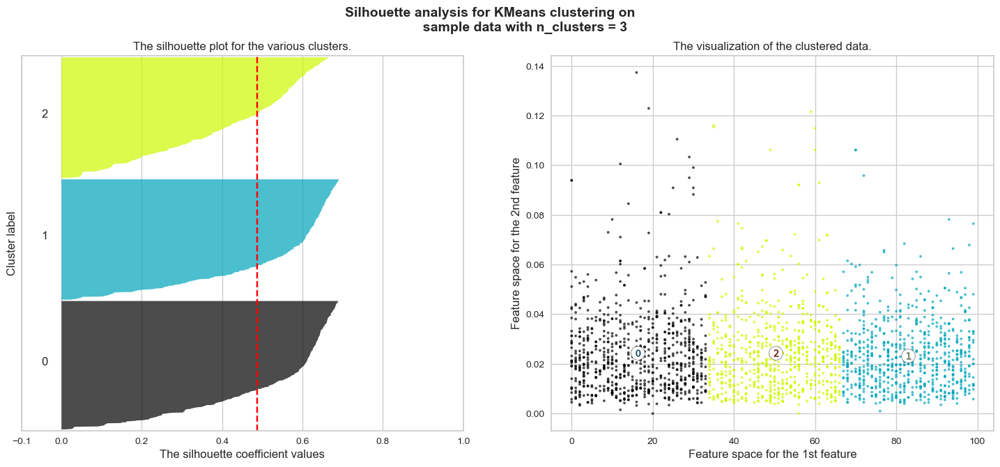

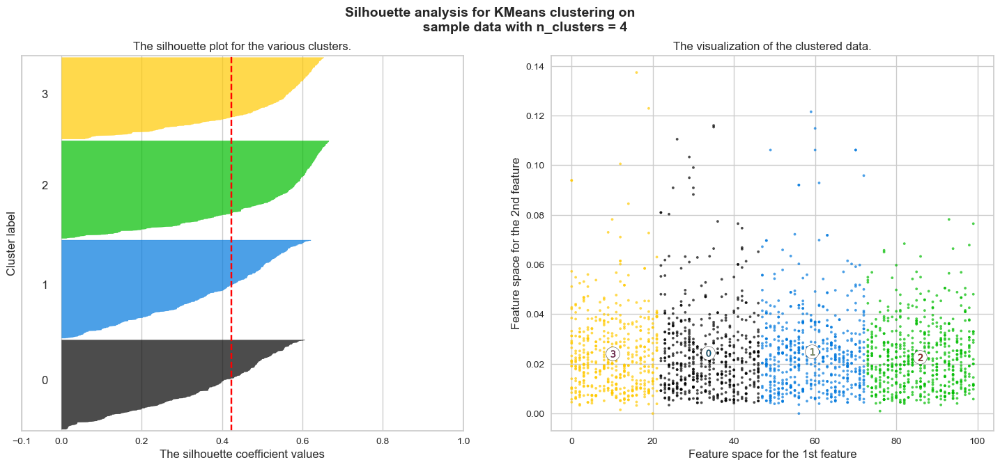

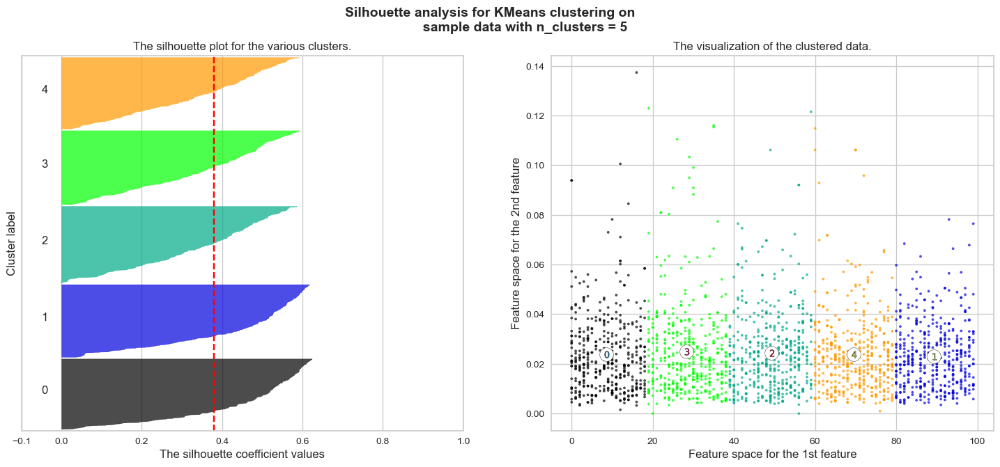

In [88]:
# Applying the Silhouette method

reduced_possible_k_values = range(2,6)

for k in reduced_possible_k_values:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df_deduplicated[features]) + (k + 1) * 10])

    model = KMeans(n_clusters=k, random_state=10)
    cluster_labels = model.fit_predict(df_deduplicated[features])
    silhouette_avg = silhouette_score(df_deduplicated[features], cluster_labels)
    sample_silhouette_values = silhouette_samples(df_deduplicated[features], cluster_labels)

    y_lower = 10
    for i in range(k):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / k)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0,
                          ith_cluster_silhouette_values, facecolor=color,
                          edgecolor=color, alpha=0.7,)
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = cm.nipy_spectral(cluster_labels.astype(float) / k)
    ax2.scatter(df_deduplicated[features].iloc[:, 0], df_deduplicated[features].iloc[:, 1], 
                marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")

    centers = model.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker="o", c="white",
                alpha=1, s=200, edgecolor="k",)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle('''Silhouette analysis for KMeans clustering on 
                  sample data with n_clusters = %d'''
                  % k, fontsize=14, fontweight="bold",)

plt.show()

### Hierarchical Clustering

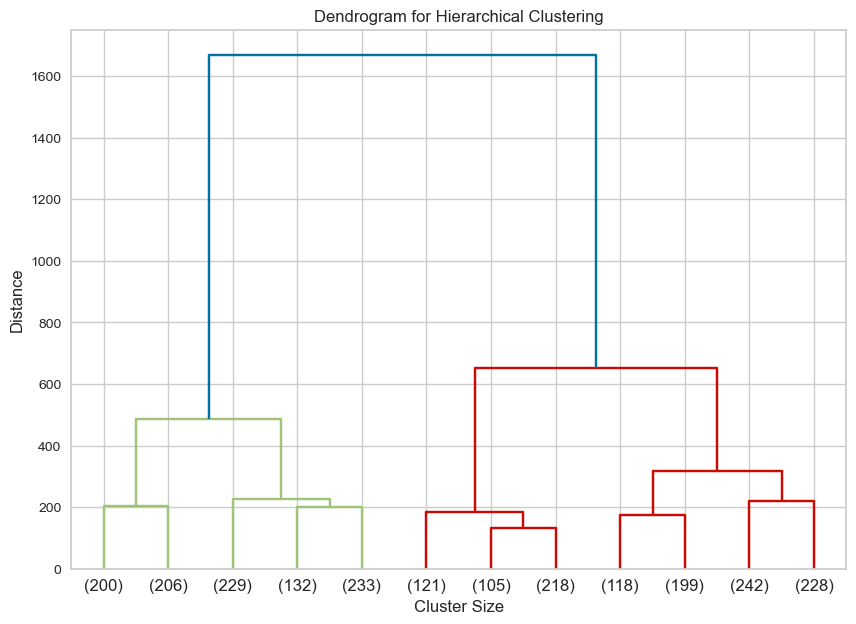

In [89]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

features = ['Recency', 'frequency', 'Total_Purchase']
Z = linkage(df_deduplicated[features], method='ward')

plt.figure(figsize=(10, 7))
dendrogram(Z, truncate_mode='lastp', p=12)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Cluster Size")
plt.ylabel("Distance")
plt.show()




In [90]:
# Cut the dendrogram at a specific number of clusters
num_clusters = 5
hierarchical_labels = fcluster(Z, num_clusters, criterion='maxclust')
df_deduplicated['Hierarchical_Cluster'] = hierarchical_labels

# Calculate Silhouette Score
hierarchical_silhouette = silhouette_score(df_deduplicated[features], hierarchical_labels)
print(f"Silhouette Score for Hierarchical Clustering: {hierarchical_silhouette:.2f}")

Silhouette Score for Hierarchical Clustering: 0.34


### Gaussian Mixture Model (GMM)

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(


Silhouette Score for GMM: 0.09


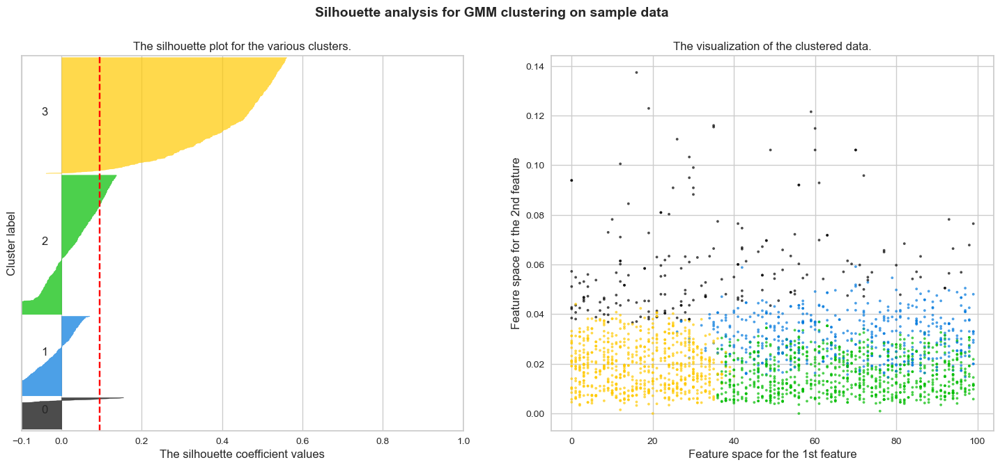

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm

# Fit GMM
gmm = GaussianMixture(n_components=4, random_state=42)
gmm_labels = gmm.fit_predict(df_deduplicated[features])
df_deduplicated['GMM_Cluster'] = gmm_labels

# Calculate Silhouette Score
gmm_silhouette = silhouette_score(df_deduplicated[features], gmm_labels)
print(f"Silhouette Score for GMM: {gmm_silhouette:.2f}")

# Visualization
if gmm_silhouette is not None:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # Silhouette plot
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df_deduplicated[features]) + (len(np.unique(gmm_labels)) + 1) * 10])

    silhouette_avg = silhouette_score(df_deduplicated[features], gmm_labels)
    sample_silhouette_values = silhouette_samples(df_deduplicated[features], gmm_labels)

    y_lower = 10
    for i in range(len(np.unique(gmm_labels))):
        ith_cluster_silhouette_values = sample_silhouette_values[gmm_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / len(np.unique(gmm_labels)))
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0,
                          ith_cluster_silhouette_values, facecolor=color,
                          edgecolor=color, alpha=0.7)
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # Scatter plot
    colors = cm.nipy_spectral(gmm_labels.astype(float) / len(np.unique(gmm_labels)))
    ax2.scatter(df_deduplicated[features].iloc[:, 0], df_deduplicated[features].iloc[:, 1], 
                marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle("Silhouette analysis for GMM clustering on sample data", fontsize=14, fontweight='bold')
    plt.show()
else:
    print("Cannot plot Silhouette analysis for GMM due to insufficient clusters.")


### MEAN SHIFT CLUSTERING

Silhouette Score for Mean Shift: 0.45


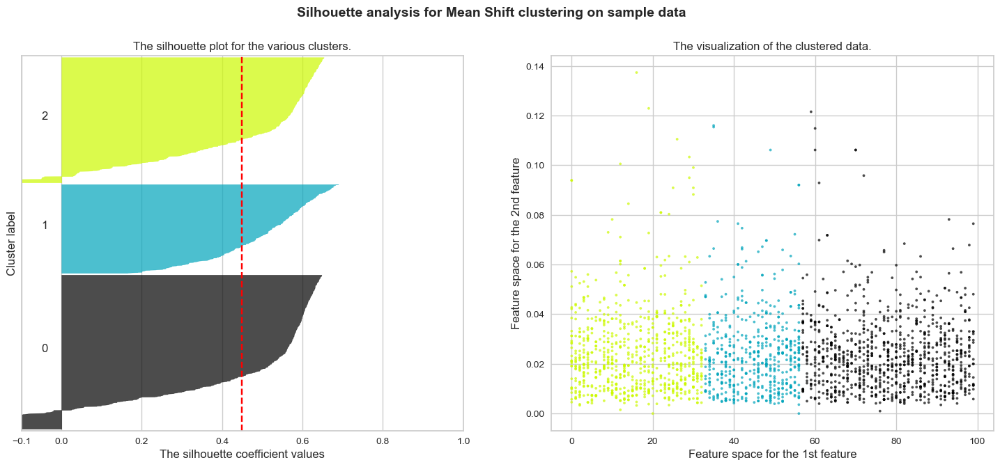

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.cluster import MeanShift
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm

# Fit Mean Shift
mean_shift = MeanShift()
mean_shift_labels = mean_shift.fit_predict(df_deduplicated[features])
df_deduplicated['MeanShift_Cluster'] = mean_shift_labels

# Calculate Silhouette Score
mean_shift_silhouette = silhouette_score(df_deduplicated[features], mean_shift_labels)
print(f"Silhouette Score for Mean Shift: {mean_shift_silhouette:.2f}")

# Visualization
if mean_shift_silhouette is not None:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # Silhouette plot
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df_deduplicated[features]) + (len(np.unique(mean_shift_labels)) + 1) * 10])

    silhouette_avg = silhouette_score(df_deduplicated[features], mean_shift_labels)
    sample_silhouette_values = silhouette_samples(df_deduplicated[features], mean_shift_labels)

    y_lower = 10
    for i in range(len(np.unique(mean_shift_labels))):
        ith_cluster_silhouette_values = sample_silhouette_values[mean_shift_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / len(np.unique(mean_shift_labels)))
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0,
                          ith_cluster_silhouette_values, facecolor=color,
                          edgecolor=color, alpha=0.7)
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # Scatter plot
    colors = cm.nipy_spectral(mean_shift_labels.astype(float) / len(np.unique(mean_shift_labels)))
    ax2.scatter(df_deduplicated[features].iloc[:, 0], df_deduplicated[features].iloc[:, 1], 
                marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle("Silhouette analysis for Mean Shift clustering on sample data", fontsize=14, fontweight='bold')
    plt.show()
else:
    print("Cannot plot Silhouette analysis for Mean Shift due to insufficient clusters.")


## Determining the Bias of the Model

In [93]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
import numpy as np
# K-Fold Cross-Validation for K-Means Clustering
kf = KFold(n_splits=5, random_state=42, shuffle=True)

def evaluate_kmeans(features, k):
    silhouette_scores = []
    for train_index, test_index in kf.split(features):
        X_train, X_test = features.iloc[train_index], features.iloc[test_index]
        model = KMeans(n_clusters=k, random_state=42).fit(X_train)
        labels = model.predict(X_test)
        silhouette_scores.append(silhouette_score(X_test, labels))
    return np.mean(silhouette_scores), np.std(silhouette_scores)

kmeans_mean_silhouette, kmeans_std_silhouette = evaluate_kmeans(df_deduplicated[features], 4)

# K-Fold Cross-Validation for Gaussian Mixture Models (GMM)
def evaluate_gmm(features, k):
    silhouette_scores = []
    for train_index, test_index in kf.split(features):
        X_train, X_test = features.iloc[train_index], features.iloc[test_index]
        model = GaussianMixture(n_components=k, random_state=42).fit(X_train)
        labels = model.predict(X_test)
        silhouette_scores.append(silhouette_score(X_test, labels))
    return np.mean(silhouette_scores), np.std(silhouette_scores)

gmm_mean_silhouette, gmm_std_silhouette = evaluate_gmm(df_deduplicated[features], 4)

# K-Fold Cross-Validation for Mean Shift
def evaluate_meanshift(features):
    silhouette_scores = []
    for train_index, test_index in kf.split(features):
        X_train, X_test = features.iloc[train_index], features.iloc[test_index]
        model = MeanShift().fit(X_train)
        labels = model.predict(X_test)
        silhouette_scores.append(silhouette_score(X_test, labels))
    return np.mean(silhouette_scores), np.std(silhouette_scores)

mean_shift_mean_silhouette, mean_shift_std_silhouette = evaluate_meanshift(df_deduplicated[features])



C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it 

In [94]:
# K-Fold Cross-Validation for hierarchical
from sklearn.model_selection import KFold
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import numpy as np

# Define the number of folds for cross-validation
n_splits = 5
kf = KFold(n_splits=n_splits)

# Initialize a list to store Silhouette scores for each fold
silhouette_scores = []

# Perform cross-validation
for train_index, test_index in kf.split(df_deduplicated[features]):
    # Split the data into train and test sets
    X_train, X_test = df_deduplicated[features].iloc[train_index], df_deduplicated[features].iloc[test_index]
    
    # Fit Hierarchical Clustering on the training data
    clustering = AgglomerativeClustering(n_clusters=4)  # Example: 4 clusters
    train_labels = clustering.fit_predict(X_train)
    
    # Calculate Silhouette score on the test set using the clusters from the training set
    silhouette = silhouette_score(X_test, clustering.fit_predict(X_test))
    silhouette_scores.append(silhouette)

# Compute the standard deviation of Silhouette scores across all folds
hierarchical_std_silhouette_score = np.std(silhouette_scores)

In [95]:
# Comparison Table
comparison_table = pd.DataFrame({
    'Model': ['K-Means', 'Hierarchical', 'GMM', 'Mean Shift'],
    'Silhouette Score': [
        silhouette_avg,  
        hierarchical_silhouette,
        gmm_silhouette,
        mean_shift_silhouette
    ],
    'Mean Silhouette Score': [
        kmeans_mean_silhouette,
        hierarchical_silhouette,  
        gmm_mean_silhouette,
        mean_shift_mean_silhouette
    ],
    'Std Silhouette Score': [
        kmeans_std_silhouette,
       hierarchical_std_silhouette_score,
        gmm_std_silhouette,
        mean_shift_std_silhouette
    ]
})

print(comparison_table)


          Model  Silhouette Score  Mean Silhouette Score  Std Silhouette Score
0       K-Means          0.448199               0.421290              0.009661
1  Hierarchical          0.335017               0.335017              0.016260
2           GMM          0.094544               0.157279              0.068398
3    Mean Shift          0.448199               0.525779              0.052162


The above indexes are the results of evaluating the effectiveness of different clustering algorithms using the Silhouette index. The Silhouette Index measures how similar a data point is to points in the same cluster compared to points in another cluster. It ranges from -1 to 1, with higher values ​​indicating clearer clusters and lower values ​​indicating unclear or overlapping clusters.

## CONCLUSION

K-Means: It has the highest average silhouette score among the considered methods, with a relatively low standard deviation (std silhouette score). This indicates that K-Means is capable of producing well-separated and consistent clusters, especially when the data has linear or spherical structures.
Therefore, we decided to choose the k-means cluster method to cluster customer groups."

# MODEL: COMBINE K-MEAN CLUSTER AND RFM

In [96]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
import json

pd.options.display.float_format = '{:,.2f}'.format

In [97]:
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar
from bokeh.palettes import brewer
from bokeh.models import HoverTool
from sklearn.preprocessing import StandardScaler

In [98]:
df_deduplicated.T

,831,1132,301,1101,2888,1948,16,729,2761,1221,...,530,635,841,2622,2213,110,1920,2315,1903,1054
ID,1001,1002,1005,1006,1007,1008,1017,1018,1022,1028,...,9963,9967,9970,9977,9979,9980,9985,9986,9990,9997
Year_Of_Birth,"1,994.00","1,989.00","1,978.00","1,987.00","1,996.00","1,996.00","1,994.00","1,990.00","1,985.00","1,985.00",...,"1,988.00","1,988.00","1,987.00","1,986.00","1,992.00","1,992.00","1,986.00","1,990.00","1,993.00","1,994.00"
Academic_Level,Graduation,Graduation,2n Cycle,Master,PhD,PhD,Graduation,Graduation,Graduation,PhD,...,Graduation,Graduation,Master,Graduation,PhD,Graduation,Graduation,Graduation,Graduation,Graduation
Income,61074,60093,79689,41021,57333,75032,83715,31814,75693,40344,...,34600,36065,59354,34421,82032,22010,38361,56628,75330,56243
Registration_Time,2021-08-17 00:00:00,2022-06-26 00:00:00,2022-12-05 00:00:00,2021-12-30 00:00:00,2021-09-22 00:00:00,2022-04-28 00:00:00,2023-03-02 00:00:00,2022-09-02 00:00:00,2021-06-12 00:00:00,2022-10-13 00:00:00,...,2022-01-01 00:00:00,2022-03-31 00:00:00,2022-11-15 00:00:00,2022-01-07 00:00:00,2023-05-04 00:00:00,2022-06-30 00:00:00,2022-12-27 00:00:00,2023-03-21 00:00:00,2021-04-10 00:00:00,2022-12-30 00:00:00
Recency,37.00,92.00,65.00,12.00,55.00,74.00,2.00,73.00,10.00,48.00,...,8.00,54.00,53.00,81.00,54.00,51.00,74.00,30.00,94.00,26.00
Liquor,790.00,503.00,312.00,15.00,942.00,953.00,319.00,36.00,798.00,211.00,...,200.00,19.00,234.00,4.00,333.00,12.00,40.00,480.00,556.00,348.00
Vegetables,2.00,14.00,28.00,9.00,16.00,14.00,10.00,5.00,155.00,2.00,...,35.00,9.00,4.00,5.00,196.00,4.00,2.00,7.00,84.00,2.00
Pork,133.00,109.00,640.00,9.00,397.00,180.00,407.00,20.00,293.00,6.00,...,60.00,34.00,53.00,7.00,377.00,9.00,56.00,82.00,257.00,35.00
Seafood,0.00,16.00,180.00,6.00,76.00,47.00,150.00,4.00,72.00,0.00,...,8.00,10.00,3.00,6.00,149.00,3.00,20.00,7.00,93.00,4.00


In [100]:
df_rfm = pd.DataFrame()
df_rfm['ID'] = df_deduplicated['ID']
df_rfm['recency'] = df_deduplicated.Recency
df_rfm['frequency'] = df_deduplicated.frequency
df_rfm['monetary'] = df_deduplicated.Total_Expenditure/date_duration
df_rfm['income'] = df_deduplicated.Income
df_rfm['Education'] =df_deduplicated.Academic_Level
df_rfm['Catalog'] =df_deduplicated.Num_Catalog_Purchases
df_rfm['Store'] =df_deduplicated.Num_Store_Purchases
df_rfm['Web'] =df_deduplicated.Num_Web_Purchases

In [119]:
df_deduplicated.Total_Expenditure

831    1,105.00
1132     738.00
301    1,318.00
1101      67.00
2888   1,665.00
         ...   
110       36.00
1920     140.00
2315     764.00
1903   1,112.00
1054     399.00
Name: Total_Expenditure, Length: 2231, dtype: float64

In [118]:
date_duration

831     1019
1132     706
301      544
1101     884
2888     983
        ... 
110      702
1920     522
2315     438
1903    1148
1054     519
Name: Registration_Time, Length: 2240, dtype: int32

In [101]:
df_rfm

,ID,recency,frequency,monetary,income,Education,Catalog,Store,Web
831,1001,37.00,0.03,1.08,61074,Graduation,5.00,8.00,11.00
1132,1002,92.00,0.03,1.05,60093,Graduation,2.00,10.00,7.00
301,1005,65.00,0.05,2.42,79689,2n Cycle,9.00,13.00,4.00
1101,1006,12.00,0.01,0.08,41021,Master,0.00,3.00,2.00
2888,1007,55.00,0.03,1.69,57333,PhD,5.00,9.00,8.00
...,...,...,...,...,...,...,...,...,...
110,9980,51.00,0.01,0.05,22010,Graduation,0.00,3.00,2.00
1920,9985,74.00,0.02,0.27,38361,Graduation,1.00,3.00,3.00
2315,9986,30.00,0.05,1.74,56628,Graduation,6.00,5.00,7.00
1903,9990,94.00,0.03,0.97,75330,Graduation,3.00,12.00,10.00


In [102]:
r_labels, f_labels, m_labels = range(5, 0, -1), range(1,6), range(1,6)

df_rfm['r'] = pd.qcut(df_rfm['recency'], q=5, labels=r_labels).astype(int)
df_rfm['f'] = pd.qcut(df_rfm['frequency'], q=5, labels=f_labels).astype(int)
df_rfm['m'] = pd.qcut(df_rfm['monetary'], q=5, labels=m_labels).astype(int)

df_rfm['rfm_sum'] = df_rfm['r'] + df_rfm['f'] + df_rfm['m']

In [103]:
df_rfm

,ID,recency,frequency,monetary,income,Education,Catalog,Store,Web,r,f,m,rfm_sum
831,1001,37.00,0.03,1.08,61074,Graduation,5.00,8.00,11.00,4,4,4,12
1132,1002,92.00,0.03,1.05,60093,Graduation,2.00,10.00,7.00,1,4,4,9
301,1005,65.00,0.05,2.42,79689,2n Cycle,9.00,13.00,4.00,2,5,5,12
1101,1006,12.00,0.01,0.08,41021,Master,0.00,3.00,2.00,5,1,1,7
2888,1007,55.00,0.03,1.69,57333,PhD,5.00,9.00,8.00,3,4,4,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,9980,51.00,0.01,0.05,22010,Graduation,0.00,3.00,2.00,3,1,1,5
1920,9985,74.00,0.02,0.27,38361,Graduation,1.00,3.00,3.00,2,3,2,7
2315,9986,30.00,0.05,1.74,56628,Graduation,6.00,5.00,7.00,4,5,5,14
1903,9990,94.00,0.03,0.97,75330,Graduation,3.00,12.00,10.00,1,4,4,9


In [104]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

In [105]:
df_cluster = df_rfm[['recency','frequency','monetary']]

In [106]:
df_cluster

,recency,frequency,monetary
831,37.00,0.03,1.08
1132,92.00,0.03,1.05
301,65.00,0.05,2.42
1101,12.00,0.01,0.08
2888,55.00,0.03,1.69
...,...,...,...
110,51.00,0.01,0.05
1920,74.00,0.02,0.27
2315,30.00,0.05,1.74
1903,94.00,0.03,0.97


In [107]:
df_rfm_score = df_rfm[['r','f','m']]

In [108]:
df_rfm_score

,r,f,m
831,4,4,4
1132,1,4,4
301,2,5,5
1101,5,1,1
2888,3,4,4
...,...,...,...
110,3,1,1
1920,2,3,2
2315,4,5,5
1903,1,4,4


C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it 

C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it 

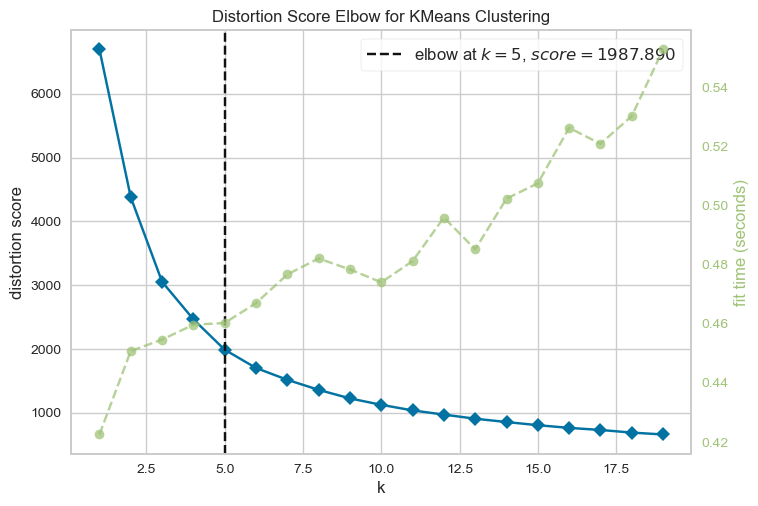

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [109]:
# Standardize the data
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(df_rfm[['recency', 'frequency', 'monetary']])
# Applying the Elbow method
model =KMeans(init='k-means++',max_iter= 300,random_state=0)
# K-Elbow Visualizer
elbow = KElbowVisualizer(model,k=(1,20))
elbow.fit(rfm_scaled)
#show the plot
elbow.show()

In [110]:
kmeans =KMeans(n_clusters=5,random_state=1)
kmeans.fit(rfm_scaled)
cluster_labels = kmeans.labels_
df_rfm_k4 = df_rfm.assign(Cluster = cluster_labels)


C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(


In [111]:
df_rfm_k4.groupby('Cluster').agg({'r':'mean','f':'mean','m':'mean'})

,r,f,m
Cluster,,,
0,1.89,4.24,4.37
1,1.77,2.14,2.08
2,4.17,1.98,1.93
3,3.21,5.00,5.00
4,4.37,4.19,4.21


In [112]:
df_rfm_k4

,ID,recency,frequency,monetary,income,Education,Catalog,Store,Web,r,f,m,rfm_sum,Cluster
831,1001,37.00,0.03,1.08,61074,Graduation,5.00,8.00,11.00,4,4,4,12,4
1132,1002,92.00,0.03,1.05,60093,Graduation,2.00,10.00,7.00,1,4,4,9,0
301,1005,65.00,0.05,2.42,79689,2n Cycle,9.00,13.00,4.00,2,5,5,12,0
1101,1006,12.00,0.01,0.08,41021,Master,0.00,3.00,2.00,5,1,1,7,2
2888,1007,55.00,0.03,1.69,57333,PhD,5.00,9.00,8.00,3,4,4,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,9980,51.00,0.01,0.05,22010,Graduation,0.00,3.00,2.00,3,1,1,5,1
1920,9985,74.00,0.02,0.27,38361,Graduation,1.00,3.00,3.00,2,3,2,7,1
2315,9986,30.00,0.05,1.74,56628,Graduation,6.00,5.00,7.00,4,5,5,14,4
1903,9990,94.00,0.03,0.97,75330,Graduation,3.00,12.00,10.00,1,4,4,9,1


In [113]:
# Add cluster label
df_rfm['cluster'] = kmeans.labels_


df_rfm

,ID,recency,frequency,monetary,income,Education,Catalog,Store,Web,r,f,m,rfm_sum,cluster
831,1001,37.00,0.03,1.08,61074,Graduation,5.00,8.00,11.00,4,4,4,12,4
1132,1002,92.00,0.03,1.05,60093,Graduation,2.00,10.00,7.00,1,4,4,9,0
301,1005,65.00,0.05,2.42,79689,2n Cycle,9.00,13.00,4.00,2,5,5,12,0
1101,1006,12.00,0.01,0.08,41021,Master,0.00,3.00,2.00,5,1,1,7,2
2888,1007,55.00,0.03,1.69,57333,PhD,5.00,9.00,8.00,3,4,4,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,9980,51.00,0.01,0.05,22010,Graduation,0.00,3.00,2.00,3,1,1,5,1
1920,9985,74.00,0.02,0.27,38361,Graduation,1.00,3.00,3.00,2,3,2,7,1
2315,9986,30.00,0.05,1.74,56628,Graduation,6.00,5.00,7.00,4,5,5,14,4
1903,9990,94.00,0.03,0.97,75330,Graduation,3.00,12.00,10.00,1,4,4,9,1


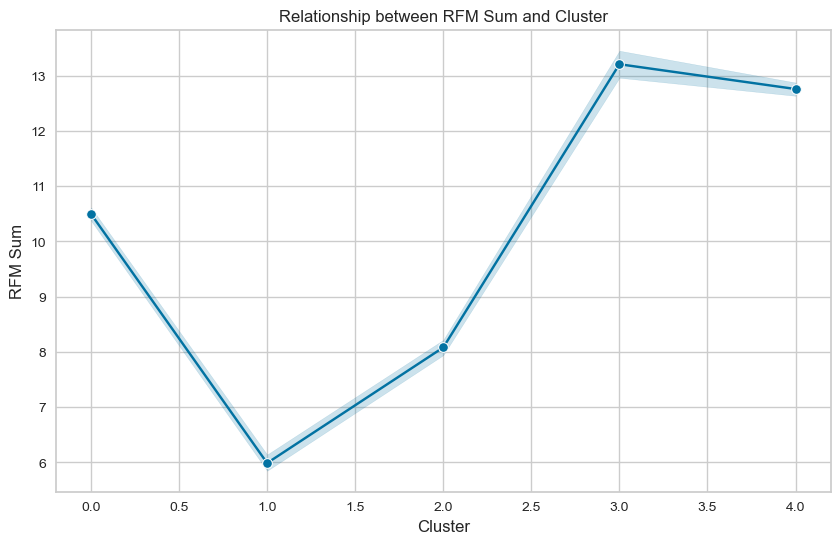

In [114]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
rfm_sum_df = pd.DataFrame([df_rfm.rfm_sum,df_rfm.cluster])# Plotting the relationship between rfm_sum and cluster
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_rfm, x='cluster', y='rfm_sum', marker='o')
plt.title('Relationship between RFM Sum and Cluster')
plt.xlabel('Cluster')
plt.ylabel('RFM Sum')
plt.grid(True)
plt.show()

In [115]:
rfm_df = df_rfm.groupby('cluster').agg({'r':'mean','f':'mean','m':'mean'})

In [116]:
rfm_df

,r,f,m
cluster,,,
0,1.89,4.24,4.37
1,1.77,2.14,2.08
2,4.17,1.98,1.93
3,3.21,5.00,5.00
4,4.37,4.19,4.21


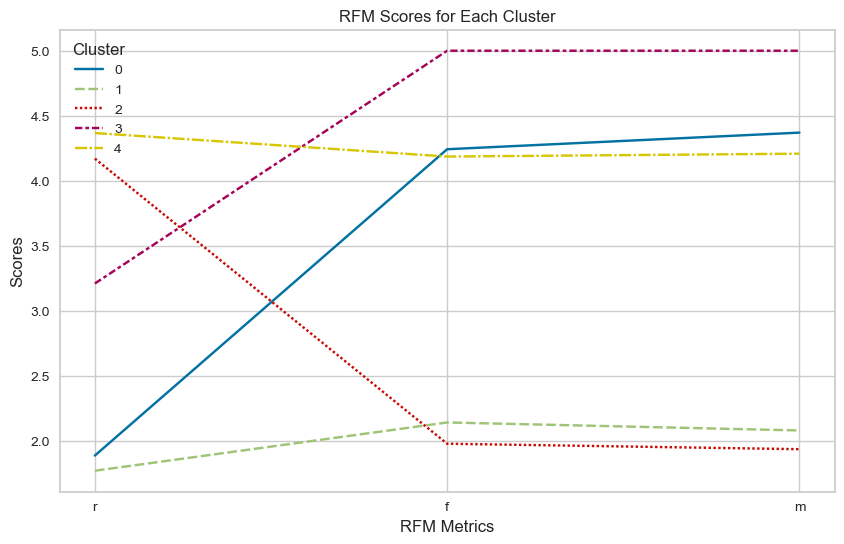

In [117]:
# Plotting the RFM scores for each cluster
plt.figure(figsize=(10, 6))
sns.lineplot(data=rfm_df.T)
plt.title('RFM Scores for Each Cluster')
plt.xlabel('RFM Metrics')
plt.ylabel('Scores')
plt.legend(title='Cluster', loc='upper left')
plt.grid(True)
plt.show()

Summary of Cluster Characteristics
1. **Cluster 4: (Lost Customers)** are customers who buy infrequently, have spent little but have made a long time since their last purchase
2. **Cluster 3: (Promise Customers)** are customers who buy infrequently, have spent little but have made recent purchases
3. **Cluster 0: (At Risk Customers)** are customers who spend a lot on the company, have not made regular purchases and have made a long time since their last purchase
4. **Cluster 2: (Loyal Customers)** Customers often have a high frequency of purchases, recent access and relative spending ...
5. **Cluster 1: (Recent Big Customers)** are customers who spend a lot on the company, have made recent purchases but have not made regular purchases 

This analysis helps in devising targeted marketing strategies to retain high-value customers, reactivate former high-value customers, and convert recent, infrequent buyers into more loyal, high-value customers.

In [742]:
# Define the cluster names based on the analysis
cluster_names = {
    0: "At Risk Customers",
    1: "Recent Big Customers",
    2: "Loyal Customers",
    3: "Promise Customers",
    4: "Lost Customers"
}

# Add a new column 'Customer_Segment' based on the cluster
df_rfm['Customer_Segment'] = df_rfm['cluster'].map(cluster_names)

In [743]:
df_rfm

,ID,recency,frequency,monetary,income,Education,Catalog,Store,Web,r,f,m,rfm_sum,cluster,Customer_Segment
831,1001,37.00,0.03,"1,105.00",61074,Graduation,5.00,8.00,11.00,4,4,4,12,1,Recent Big Customers
1132,1002,92.00,0.03,738.00,60093,Graduation,2.00,10.00,7.00,1,4,4,9,0,At Risk Customers
301,1005,65.00,0.05,"1,318.00",79689,2n Cycle,9.00,13.00,4.00,2,5,5,12,0,At Risk Customers
1101,1006,12.00,0.01,67.00,41021,Master,0.00,3.00,2.00,5,1,2,8,3,Promise Customers
2888,1007,55.00,0.03,"1,665.00",57333,PhD,5.00,9.00,8.00,3,4,5,12,0,At Risk Customers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,9980,51.00,0.01,36.00,22010,Graduation,0.00,3.00,2.00,3,1,1,5,4,Lost Customers
1920,9985,74.00,0.02,140.00,38361,Graduation,1.00,3.00,3.00,2,3,2,7,4,Lost Customers
2315,9986,30.00,0.05,764.00,56628,Graduation,6.00,5.00,7.00,4,5,4,13,1,Recent Big Customers
1903,9990,94.00,0.03,"1,112.00",75330,Graduation,3.00,12.00,10.00,1,4,4,9,0,At Risk Customers


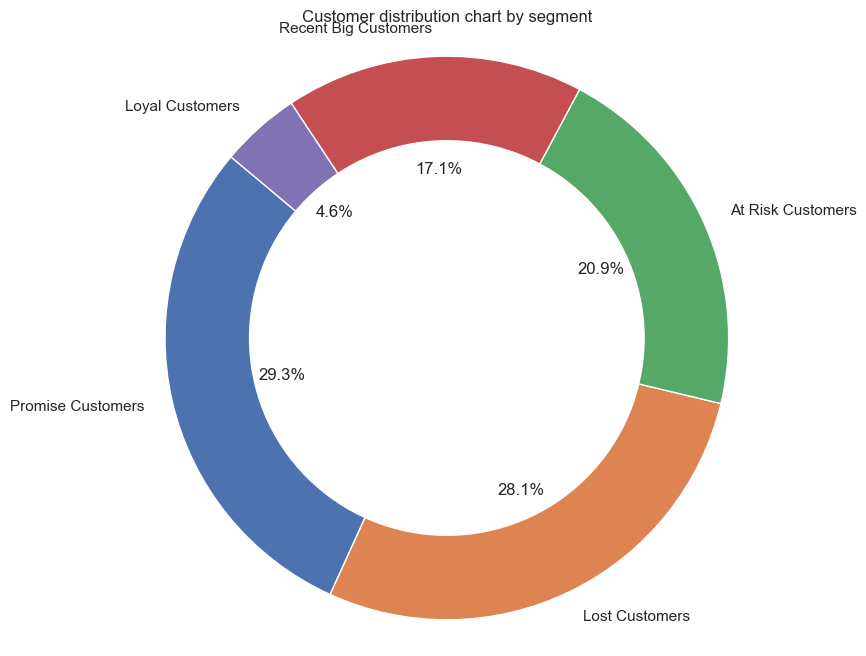

In [744]:
# Calculate the number of customers in each segment
segment_counts = df_rfm['Customer_Segment'].value_counts()

# Create a pie circle
plt.figure(figsize=(8, 8))
plt.pie(segment_counts, labels=segment_counts.index, autopct='%1.1f%%', startangle=140)

# Create a small pie circle in the middle (donut hole)
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Add a title
plt.title('Customer distribution chart by segment')

# Show the chart
plt.axis('equal') # Ensure the circle
plt.show()

Customers who bring most of the company's revenue are Recent Big Customers, At Risk Customers and Loyal Customers: 42.6%

Regular customers only account for 4.6% (Loyal customers)

Customers tend to leave 47% (At Risk Customers and Lost Customers)

In [745]:
df_cluster['Customer_Segment'] = df_rfm.Customer_Segment

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_3004\4259495727.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cluster['Customer_Segment'] = df_rfm.Customer_Segment


In [746]:
df_cluster

,recency,frequency,monetary,Customer_Segment
831,37.00,0.03,"1,105.00",Recent Big Customers
1132,92.00,0.03,738.00,At Risk Customers
301,65.00,0.05,"1,318.00",At Risk Customers
1101,12.00,0.01,67.00,Promise Customers
2888,55.00,0.03,"1,665.00",At Risk Customers
...,...,...,...,...
110,51.00,0.01,36.00,Lost Customers
1920,74.00,0.02,140.00,Lost Customers
2315,30.00,0.05,764.00,Recent Big Customers
1903,94.00,0.03,"1,112.00",At Risk Customers


C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_3004\2632238732.py:15: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  recency_heatmap = mean_values.pivot("Customer_Segment", "average", "recency")
C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_3004\2632238732.py:21: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  frequency_heatmap = mean_values.pivot("Customer_Segment", "average", "frequency")
C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_3004\2632238732.py:27: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  monetary_heatmap = mean_values.pivot("Customer_Segment", "average", "monetary")


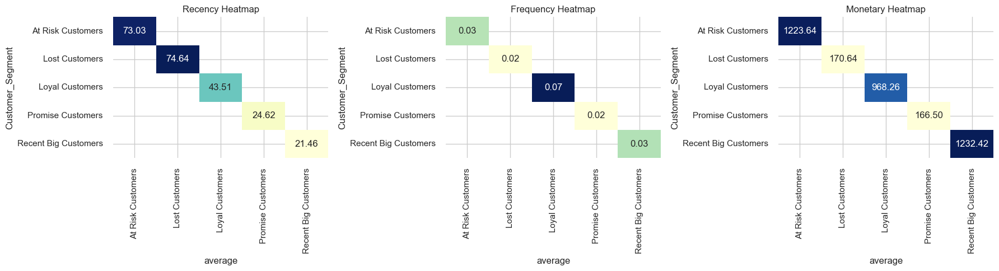

In [747]:
#Calculate the average value for each index according to each customer segment
mean_values= df_cluster.groupby('Customer_Segment').mean().reset_index()

# Create an index column to use for the columns axis
mean_values['average'] = mean_values['Customer_Segment']

# Set the seaborn's style
sns.set(style="whitegrid")

# Draw heatmap for each index
plt.figure(figsize=(18, 5))

# Heatmap for recency
plt.subplot(1, 3, 1)
recency_heatmap = mean_values.pivot("Customer_Segment", "average", "recency")
sns.heatmap(recency_heatmap, annot=True, fmt=".2f", cmap="YlGnBu", cbar=False)
plt.title('Recency Heatmap')

# Heatmap for frequency
plt.subplot(1, 3, 2)
frequency_heatmap = mean_values.pivot("Customer_Segment", "average", "frequency")
sns.heatmap(frequency_heatmap, annot=True, fmt=".2f", cmap="YlGnBu", cbar=False)
plt.title('Frequency Heatmap')

# Heatmap for monetary
plt.subplot(1, 3, 3)
monetary_heatmap = mean_values.pivot("Customer_Segment", "average", "monetary")
sns.heatmap(monetary_heatmap, annot=True, fmt=".2f", cmap="YlGnBu", cbar=False)
plt.title('Monetary Heatmap')

plt.tight_layout()
plt.show()

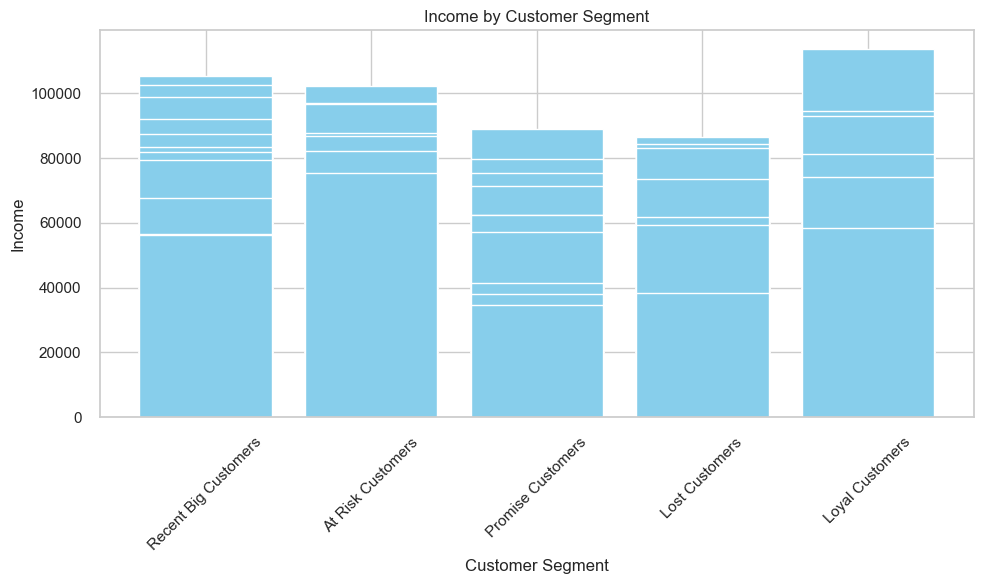

In [748]:
#Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(df_rfm['Customer_Segment'], df_rfm.income, color='skyblue')

# Add title and label
plt.title('Income by Customer Segment')
plt.xlabel('Customer Segment')
plt.ylabel('Income')

# Display the chart
plt.xticks(rotation=45) # Rotate x-axis labels to avoid overlapping
plt.tight_layout() # Make sure elements are not clipped
plt.show()

Loyal Customers: high income

Recent Big Customers and At Risk Customers: relatively high income

Promise Customers and Lost Customers: average income

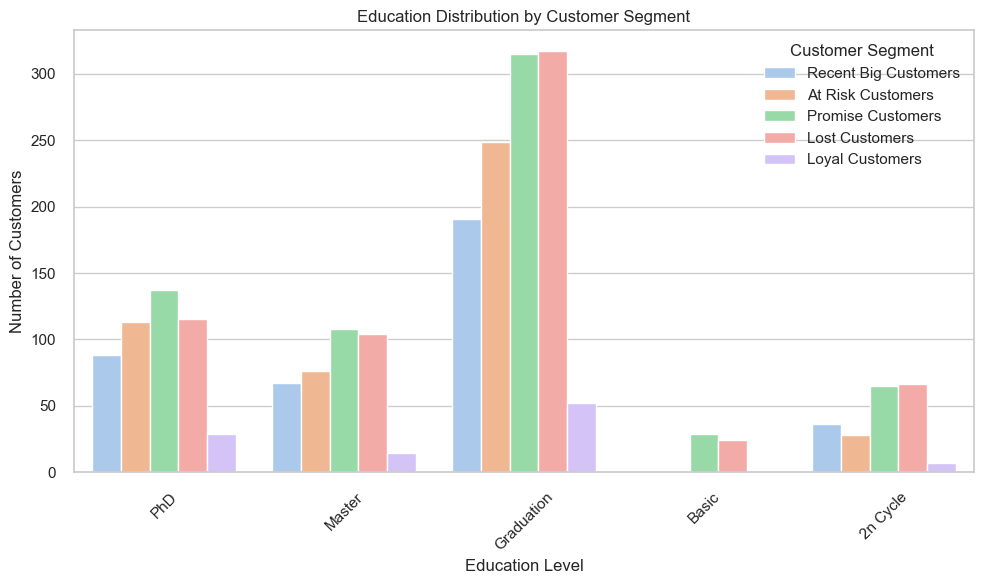

In [749]:
# Create a boxplot

plt.figure(figsize=(10, 6))

sns.countplot(x='Education', hue='Customer_Segment', data=df_rfm, palette='pastel', order=['PhD','Master','Graduation','Basic','2n Cycle'])

# Add title and label
plt.title('Education Distribution by Customer Segment')
plt.xlabel('Education Level')
plt.ylabel('Number of Customers')

# Display the plot
plt.xticks(rotation=45) # Rotate x-axis labels to avoid overlapping
plt.tight_layout() # Make sure no elements are clipped
plt.legend(title='Customer Segment')
plt.show()

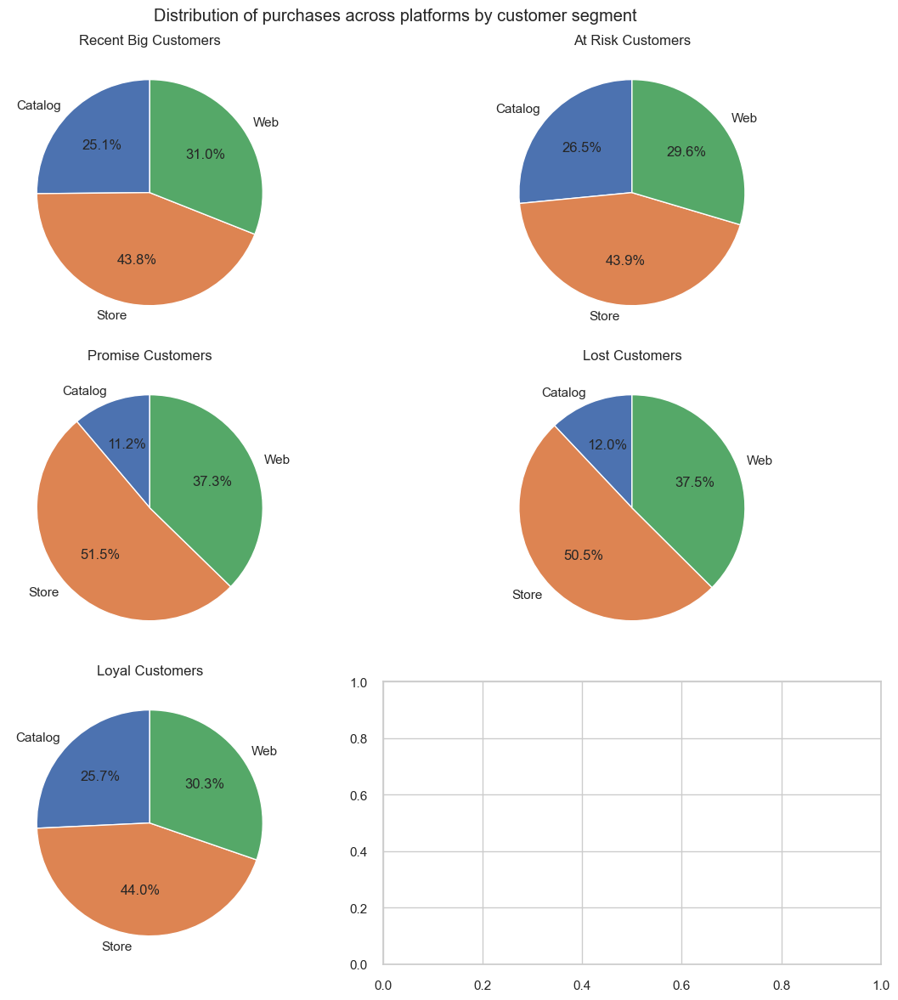

In [750]:
segments = df_rfm.Customer_Segment.unique()
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

for i, segment in enumerate(segments):
    row = i // 2
    col = i % 2
    segment_data = df_rfm[df_rfm['Customer_Segment'] == segment]
    platform_counts = segment_data[['Catalog', 'Store', 'Web']].sum()
    axs[row, col].pie(platform_counts, labels=platform_counts.index, autopct='%1.1f%%', startangle=90)
    axs[row, col].set_title(segment)

plt.suptitle('Distribution of purchases across platforms by customer segment')
plt.tight_layout()
plt.show()

Recent Big customers, Loyal customers and At risk customers: purchase mainly through stores. The rate of purchases through catalogs is higher than the other group

Promise customers and Lost customers: mainly purchased through stores

In [751]:
df_normal = df_deduplicated.copy()

In [752]:
df_normal['Customer_Segment'] = df_rfm.Customer_Segment

In [753]:
df_normal.columns

Index(['ID', 'Year_Of_Birth', 'Academic_Level', 'Income', 'Registration_Time',
       'Recency', 'Liquor', 'Vegetables', 'Pork', 'Seafood', 'Candy',
       'Jewellery', 'Num_Deals_Purchases', 'Num_Web_Purchases',
       'Num_Catalog_Purchases', 'Num_Store_Purchases', 'Num_Web_Visits_Month',
       'Promo_30', 'Promo_40', 'Promo_50', 'Promo_10', 'Promo_20', 'Complain',
       'Gender', 'Phone', 'Year_Register', 'Month_Register', 'Total_Purchase',
       'Living_With', 'Payment_Method', 'Living_Status', 'Number_of_Children',
       'Age', 'frequency', 'Age_Group', 'Total_Expenditure', 'Income_Group',
       'Hierarchical_Cluster', 'GMM_Cluster', 'MeanShift_Cluster',
       'Customer_Segment'],
      dtype='object')

In [754]:
df_expend = df_normal[['Liquor', 'Vegetables', 'Pork', 'Seafood', 'Candy',
 'Jewellery','Total_Expenditure','Customer_Segment']]



In [755]:
df_expend.columns

Index(['Liquor', 'Vegetables', 'Pork', 'Seafood', 'Candy', 'Jewellery',
       'Total_Expenditure', 'Customer_Segment'],
      dtype='object')

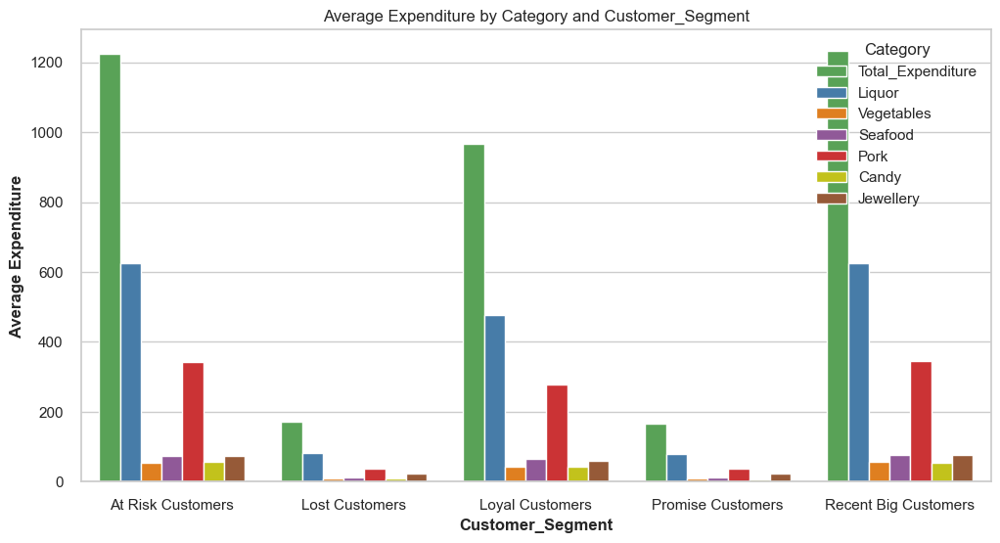

In [756]:
import matplotlib.pyplot as plt
import seaborn as sns
# Aggregate data by Number_of_Children
agg_data = df_expend.groupby('Customer_Segment').mean().reset_index()

# Data for plotting
categories = ['Total_Expenditure', 'Liquor', 'Vegetables', 'Seafood','Pork','Candy','Jewellery']
agg_data_melted = agg_data.melt(id_vars='Customer_Segment', value_vars=categories,
                                var_name='Category', value_name='Expenditure')
# Custom color palette
custom_palette = ['#4daf4a', '#377eb8', '#ff7f00', '#984ea3', '#e41a1c', '#dede00', '#a65628']
# Plotting the clustered bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='Customer_Segment', y='Expenditure', hue='Category', data=agg_data_melted,palette=custom_palette)

# Adding labels and title
plt.xlabel('Customer_Segment', fontweight='bold')
plt.ylabel('Average Expenditure', fontweight='bold')
plt.title('Average Expenditure by Category and Customer_Segment')
plt.legend(title='Category')

# Show plot
plt.show()

Recent Big customers, Loyal customers và At risk customers : chi tiêu nhiều, “mạnh tay”, đặc biệt là rượu

Promise customers và Lost customers: chi tiêu ít và chi tiêu rượu ít 

In [757]:
df_normal

,ID,Year_Of_Birth,Academic_Level,Income,Registration_Time,Recency,Liquor,Vegetables,Pork,Seafood,...,Number_of_Children,Age,frequency,Age_Group,Total_Expenditure,Income_Group,Hierarchical_Cluster,GMM_Cluster,MeanShift_Cluster,Customer_Segment
831,1001,"1,994.00",Graduation,61074,2021-08-17,37.00,790.00,2.00,133.00,0.00,...,1,30.00,0.03,30 - 40 years old,"1,105.00","60,000 - 90,000",2,2,1,Recent Big Customers
1132,1002,"1,989.00",Graduation,60093,2022-06-26,92.00,503.00,14.00,109.00,16.00,...,1,35.00,0.03,30 - 40 years old,738.00,"60,000 - 90,000",4,1,0,At Risk Customers
301,1005,"1,978.00",2n Cycle,79689,2022-12-05,65.00,312.00,28.00,640.00,180.00,...,0,46.00,0.05,40 years old or older,"1,318.00","60,000 - 90,000",3,1,0,At Risk Customers
1101,1006,"1,987.00",Master,41021,2021-12-30,12.00,15.00,9.00,9.00,6.00,...,1,37.00,0.01,30 - 40 years old,67.00,"30,000 - 60,000",1,3,2,Promise Customers
2888,1007,"1,996.00",PhD,57333,2021-09-22,55.00,942.00,16.00,397.00,76.00,...,1,28.00,0.03,< 30 years old,"1,665.00","30,000 - 60,000",3,2,1,At Risk Customers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,9980,"1,992.00",Graduation,22010,2022-06-30,51.00,12.00,4.00,9.00,3.00,...,1,32.00,0.01,30 - 40 years old,36.00,"< 30,000",3,2,1,Lost Customers
1920,9985,"1,986.00",Graduation,38361,2022-12-27,74.00,40.00,2.00,56.00,20.00,...,1,38.00,0.02,30 - 40 years old,140.00,"30,000 - 60,000",5,1,0,Lost Customers
2315,9986,"1,990.00",Graduation,56628,2023-03-21,30.00,480.00,7.00,82.00,7.00,...,1,34.00,0.05,30 - 40 years old,764.00,"30,000 - 60,000",2,0,2,Recent Big Customers
1903,9990,"1,993.00",Graduation,75330,2021-04-10,94.00,556.00,84.00,257.00,93.00,...,2,31.00,0.03,30 - 40 years old,"1,112.00","60,000 - 90,000",4,2,0,At Risk Customers


In [758]:
df_normal.columns

Index(['ID', 'Year_Of_Birth', 'Academic_Level', 'Income', 'Registration_Time',
       'Recency', 'Liquor', 'Vegetables', 'Pork', 'Seafood', 'Candy',
       'Jewellery', 'Num_Deals_Purchases', 'Num_Web_Purchases',
       'Num_Catalog_Purchases', 'Num_Store_Purchases', 'Num_Web_Visits_Month',
       'Promo_30', 'Promo_40', 'Promo_50', 'Promo_10', 'Promo_20', 'Complain',
       'Gender', 'Phone', 'Year_Register', 'Month_Register', 'Total_Purchase',
       'Living_With', 'Payment_Method', 'Living_Status', 'Number_of_Children',
       'Age', 'frequency', 'Age_Group', 'Total_Expenditure', 'Income_Group',
       'Hierarchical_Cluster', 'GMM_Cluster', 'MeanShift_Cluster',
       'Customer_Segment'],
      dtype='object')

In [759]:
df_child = df_normal[['Number_of_Children','Customer_Segment']]

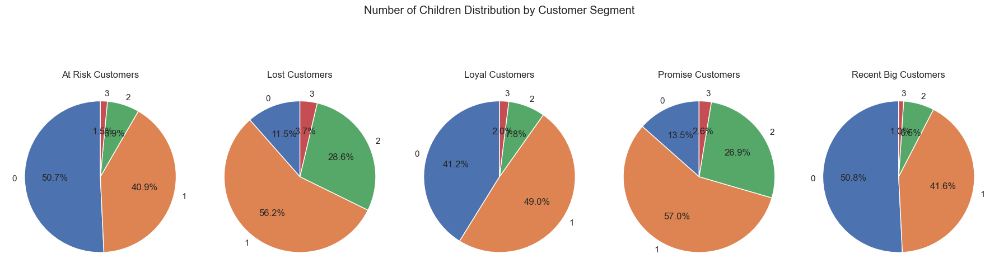

In [760]:
# Calculate the total number of children by customer segment
children_counts = df_child.groupby(['Customer_Segment', 'Number_of_Children']).size().unstack(fill_value=0)

# Draw a pie chart for each customer segment
fig, axes = plt.subplots(1, len(children_counts), figsize=(18, 6))
fig.suptitle('Number of Children Distribution by Customer Segment')

for ax, (segment, counts) in zip(axes, children_counts.iterrows()):
 counts.plot(kind='pie', ax=ax, autopct='%1.1f%%', startangle=90, legend=False)
 ax.set_ylabel('')
 ax.set_title(segment)

plt.tight_layout()
plt.show()

Recent Big customers, Loyal customers and At risk customers: mostly childless families
Promise customers and Lost customers: large families

In [761]:
df_normal.columns

Index(['ID', 'Year_Of_Birth', 'Academic_Level', 'Income', 'Registration_Time',
       'Recency', 'Liquor', 'Vegetables', 'Pork', 'Seafood', 'Candy',
       'Jewellery', 'Num_Deals_Purchases', 'Num_Web_Purchases',
       'Num_Catalog_Purchases', 'Num_Store_Purchases', 'Num_Web_Visits_Month',
       'Promo_30', 'Promo_40', 'Promo_50', 'Promo_10', 'Promo_20', 'Complain',
       'Gender', 'Phone', 'Year_Register', 'Month_Register', 'Total_Purchase',
       'Living_With', 'Payment_Method', 'Living_Status', 'Number_of_Children',
       'Age', 'frequency', 'Age_Group', 'Total_Expenditure', 'Income_Group',
       'Hierarchical_Cluster', 'GMM_Cluster', 'MeanShift_Cluster',
       'Customer_Segment'],
      dtype='object')

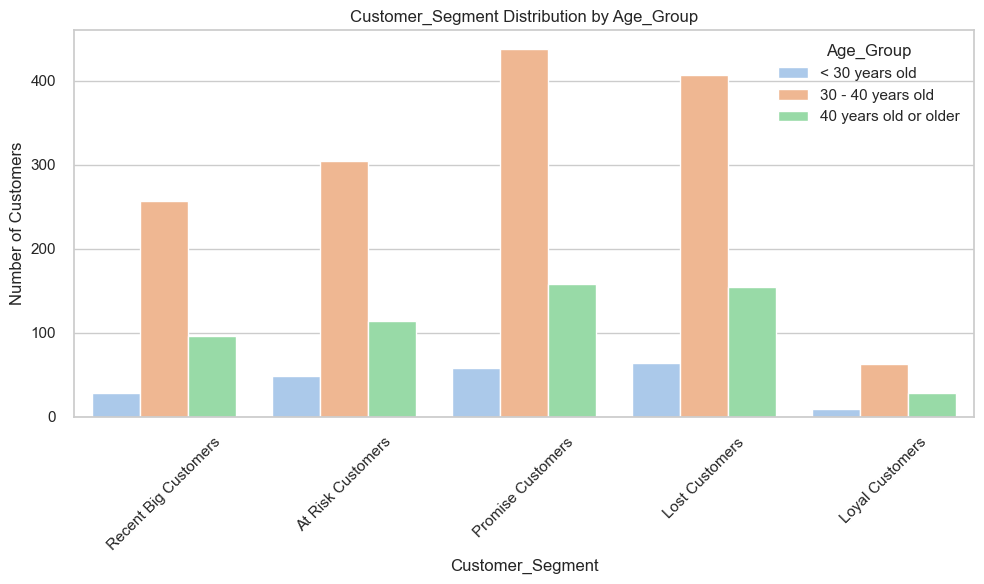

In [762]:
# Create a boxplot

plt.figure(figsize=(10, 6))

sns.countplot(x='Customer_Segment', hue='Age_Group', data=df_normal, palette='pastel')

# Add title and label
plt.title('Customer_Segment Distribution by Age_Group')
plt.xlabel('Customer_Segment')
plt.ylabel('Number of Customers')

# Display the plot
plt.xticks(rotation=45) # Rotate x-axis labels to avoid overlapping
plt.tight_layout() # Make sure no elements are clipped
plt.legend(title='Age_Group')
plt.show()

In [763]:
df_normal.T

,831,1132,301,1101,2888,1948,16,729,2761,1221,...,530,635,841,2622,2213,110,1920,2315,1903,1054
ID,1001,1002,1005,1006,1007,1008,1017,1018,1022,1028,...,9963,9967,9970,9977,9979,9980,9985,9986,9990,9997
Year_Of_Birth,"1,994.00","1,989.00","1,978.00","1,987.00","1,996.00","1,996.00","1,994.00","1,990.00","1,985.00","1,985.00",...,"1,988.00","1,988.00","1,987.00","1,986.00","1,992.00","1,992.00","1,986.00","1,990.00","1,993.00","1,994.00"
Academic_Level,Graduation,Graduation,2n Cycle,Master,PhD,PhD,Graduation,Graduation,Graduation,PhD,...,Graduation,Graduation,Master,Graduation,PhD,Graduation,Graduation,Graduation,Graduation,Graduation
Income,61074,60093,79689,41021,57333,75032,83715,31814,75693,40344,...,34600,36065,59354,34421,82032,22010,38361,56628,75330,56243
Registration_Time,2021-08-17 00:00:00,2022-06-26 00:00:00,2022-12-05 00:00:00,2021-12-30 00:00:00,2021-09-22 00:00:00,2022-04-28 00:00:00,2023-03-02 00:00:00,2022-09-02 00:00:00,2021-06-12 00:00:00,2022-10-13 00:00:00,...,2022-01-01 00:00:00,2022-03-31 00:00:00,2022-11-15 00:00:00,2022-01-07 00:00:00,2023-05-04 00:00:00,2022-06-30 00:00:00,2022-12-27 00:00:00,2023-03-21 00:00:00,2021-04-10 00:00:00,2022-12-30 00:00:00
Recency,37.00,92.00,65.00,12.00,55.00,74.00,2.00,73.00,10.00,48.00,...,8.00,54.00,53.00,81.00,54.00,51.00,74.00,30.00,94.00,26.00
Liquor,790.00,503.00,312.00,15.00,942.00,953.00,319.00,36.00,798.00,211.00,...,200.00,19.00,234.00,4.00,333.00,12.00,40.00,480.00,556.00,348.00
Vegetables,2.00,14.00,28.00,9.00,16.00,14.00,10.00,5.00,155.00,2.00,...,35.00,9.00,4.00,5.00,196.00,4.00,2.00,7.00,84.00,2.00
Pork,133.00,109.00,640.00,9.00,397.00,180.00,407.00,20.00,293.00,6.00,...,60.00,34.00,53.00,7.00,377.00,9.00,56.00,82.00,257.00,35.00
Seafood,0.00,16.00,180.00,6.00,76.00,47.00,150.00,4.00,72.00,0.00,...,8.00,10.00,3.00,6.00,149.00,3.00,20.00,7.00,93.00,4.00


In [764]:
df_normal['membership_duration'] = currentYear.year - df_deduplicated.Year_Register

In [765]:
df_normal.columns

Index(['ID', 'Year_Of_Birth', 'Academic_Level', 'Income', 'Registration_Time',
       'Recency', 'Liquor', 'Vegetables', 'Pork', 'Seafood', 'Candy',
       'Jewellery', 'Num_Deals_Purchases', 'Num_Web_Purchases',
       'Num_Catalog_Purchases', 'Num_Store_Purchases', 'Num_Web_Visits_Month',
       'Promo_30', 'Promo_40', 'Promo_50', 'Promo_10', 'Promo_20', 'Complain',
       'Gender', 'Phone', 'Year_Register', 'Month_Register', 'Total_Purchase',
       'Living_With', 'Payment_Method', 'Living_Status', 'Number_of_Children',
       'Age', 'frequency', 'Age_Group', 'Total_Expenditure', 'Income_Group',
       'Hierarchical_Cluster', 'GMM_Cluster', 'MeanShift_Cluster',
       'Customer_Segment', 'membership_duration'],
      dtype='object')

In [766]:
df_duration = df_normal[['membership_duration','Customer_Segment']]

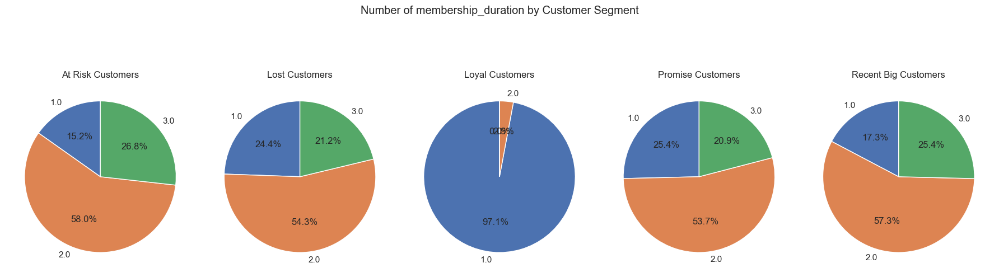

In [767]:
# Calculate the total number of children by customer segment
children_counts = df_duration.groupby(['Customer_Segment', 'membership_duration']).size().unstack(fill_value=0)

# Draw a pie chart for each customer segment
fig, axes = plt.subplots(1, len(children_counts), figsize=(18, 6))
fig.suptitle('Number of membership_duration by Customer Segment')

for ax, (segment, counts) in zip(axes, children_counts.iterrows()):
 counts.plot(kind='pie', ax=ax, autopct='%1.1f%%', startangle=90, legend=False)
 ax.set_ylabel('')
 ax.set_title(segment)

plt.tight_layout()
plt.show()

In [768]:
df_promo = df_normal[['Promo_30', 'Promo_40', 'Promo_50', 'Promo_10', 'Promo_20','Customer_Segment']]

In [769]:
df_promo = df_promo.set_index('Customer_Segment').unstack().reset_index()


In [770]:
df_promo.columns = ['Promotion','Customer_Segment','Accept']

In [771]:
df_promo

,Promotion,Customer_Segment,Accept
0,Promo_30,Recent Big Customers,0.00
1,Promo_30,At Risk Customers,0.00
2,Promo_30,At Risk Customers,0.00
3,Promo_30,Promise Customers,0.00
4,Promo_30,At Risk Customers,0.00
...,...,...,...
11150,Promo_20,Lost Customers,0.00
11151,Promo_20,Lost Customers,0.00
11152,Promo_20,Recent Big Customers,0.00
11153,Promo_20,At Risk Customers,0.00


In [772]:
df_promo_accept = df_promo[df_promo.Accept ==1]

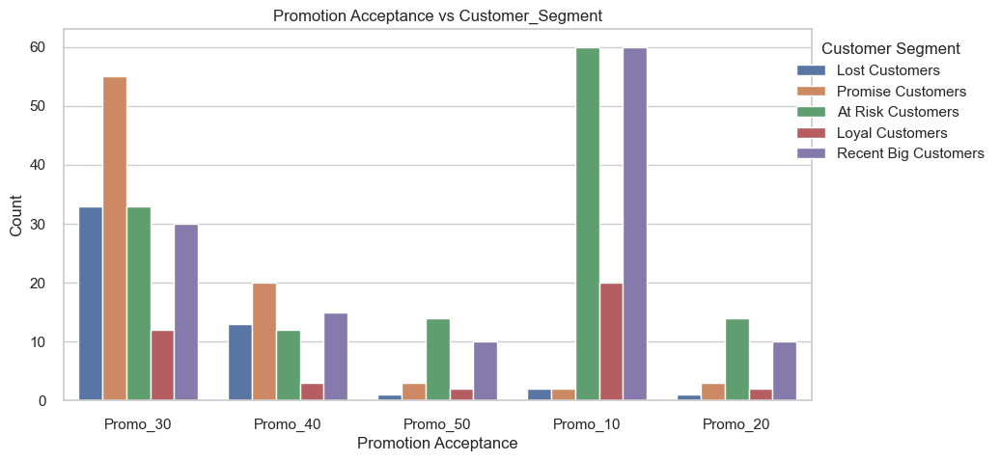

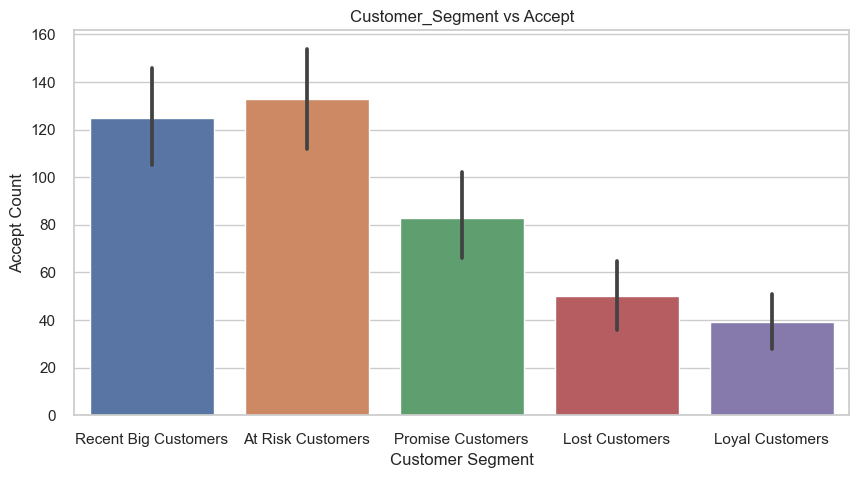

In [773]:
# Plot 1: Promotion vs Customer_Segment
plt.figure(figsize=(10, 5))
plot = sns.countplot(x='Promotion', hue='Customer_Segment', data=df_promo_accept)
plt.title('Promotion Acceptance vs Customer_Segment')
plt.xlabel('Promotion Acceptance')
plt.ylabel('Count')

# Adjust legend position
handles, labels = plot.get_legend_handles_labels()
plt.legend(title='Customer Segment', handles=handles, labels=labels, loc='upper right', bbox_to_anchor=(1.25, 1))

# Plot 2: Customer_Segment vs Accept
plt.figure(figsize=(10, 5))
sns.barplot(x='Customer_Segment', y='Accept', data=df_promo, estimator=sum)
plt.title('Customer_Segment vs Accept')
plt.xlabel('Customer Segment')
plt.ylabel('Accept Count')
plt.show()

Recent Big customers and At risk customers: high offer acceptance rate

Promise customers: average offer acceptance rate

Lost Customers and Loyal Customers: low offer acceptance rate

In [774]:
df_normal.columns

Index(['ID', 'Year_Of_Birth', 'Academic_Level', 'Income', 'Registration_Time',
       'Recency', 'Liquor', 'Vegetables', 'Pork', 'Seafood', 'Candy',
       'Jewellery', 'Num_Deals_Purchases', 'Num_Web_Purchases',
       'Num_Catalog_Purchases', 'Num_Store_Purchases', 'Num_Web_Visits_Month',
       'Promo_30', 'Promo_40', 'Promo_50', 'Promo_10', 'Promo_20', 'Complain',
       'Gender', 'Phone', 'Year_Register', 'Month_Register', 'Total_Purchase',
       'Living_With', 'Payment_Method', 'Living_Status', 'Number_of_Children',
       'Age', 'frequency', 'Age_Group', 'Total_Expenditure', 'Income_Group',
       'Hierarchical_Cluster', 'GMM_Cluster', 'MeanShift_Cluster',
       'Customer_Segment', 'membership_duration'],
      dtype='object')

In [775]:
df_promo_cluster = df_normal[['Promo_30', 'Promo_40', 'Promo_50', 'Promo_10', 'Promo_20','Customer_Segment']]

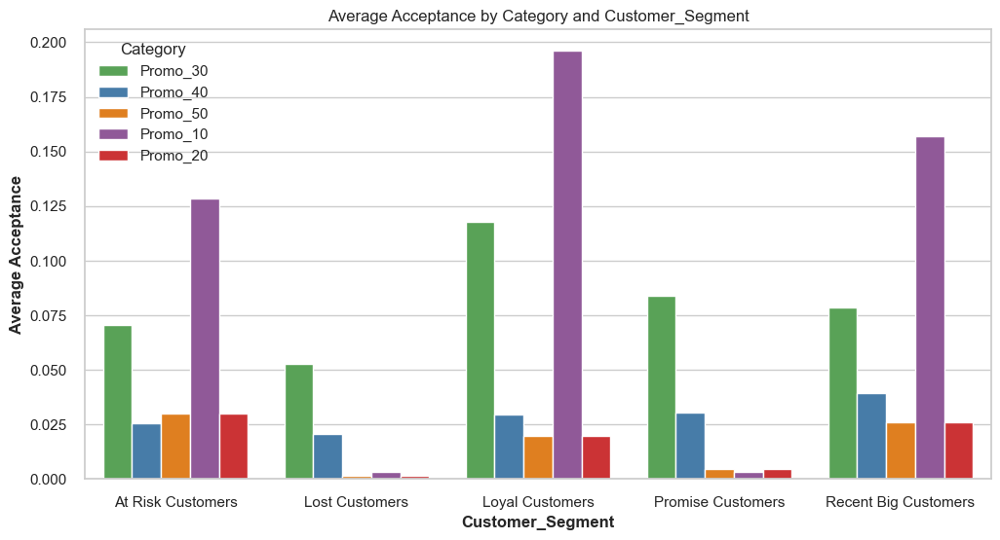

In [776]:
import matplotlib.pyplot as plt
import seaborn as sns
# Aggregate data by Number_of_Children
agg_data = df_promo_cluster.groupby('Customer_Segment').mean().reset_index()

# Data for plotting
categories = ['Promo_30', 'Promo_40', 'Promo_50', 'Promo_10', 'Promo_20']
agg_data_melted = agg_data.melt(id_vars='Customer_Segment', value_vars=categories,
                                var_name='Category', value_name='Promotion')
# Custom color palette
custom_palette = ['#4daf4a', '#377eb8', '#ff7f00', '#984ea3', '#e41a1c']
# Plotting the clustered bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='Customer_Segment', y='Promotion', hue='Category', data=agg_data_melted,palette=custom_palette)

# Adding labels and title
plt.xlabel('Customer_Segment', fontweight='bold')
plt.ylabel('Average Acceptance', fontweight='bold')
plt.title('Average Acceptance by Category and Customer_Segment')
plt.legend(title='Category')

# Show plot
plt.show()

Recent Big Customers, At risk customers and Loyal Customers: highest 10% offer acceptance rate
    
Promise customers and Lost Customers: most accept 30% and 40% incentives

# **FEATURE SELECTION**

In [777]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from xgboost import plot_importance #conda install -c conda-forge xgboost
import matplotlib.pyplot as plt
from numpy import sort
from sklearn.feature_selection import SelectFromModel

In [778]:
df_deduplicated.T

,831,1132,301,1101,2888,1948,16,729,2761,1221,...,530,635,841,2622,2213,110,1920,2315,1903,1054
ID,1001,1002,1005,1006,1007,1008,1017,1018,1022,1028,...,9963,9967,9970,9977,9979,9980,9985,9986,9990,9997
Year_Of_Birth,"1,994.00","1,989.00","1,978.00","1,987.00","1,996.00","1,996.00","1,994.00","1,990.00","1,985.00","1,985.00",...,"1,988.00","1,988.00","1,987.00","1,986.00","1,992.00","1,992.00","1,986.00","1,990.00","1,993.00","1,994.00"
Academic_Level,Graduation,Graduation,2n Cycle,Master,PhD,PhD,Graduation,Graduation,Graduation,PhD,...,Graduation,Graduation,Master,Graduation,PhD,Graduation,Graduation,Graduation,Graduation,Graduation
Income,61074,60093,79689,41021,57333,75032,83715,31814,75693,40344,...,34600,36065,59354,34421,82032,22010,38361,56628,75330,56243
Registration_Time,2021-08-17 00:00:00,2022-06-26 00:00:00,2022-12-05 00:00:00,2021-12-30 00:00:00,2021-09-22 00:00:00,2022-04-28 00:00:00,2023-03-02 00:00:00,2022-09-02 00:00:00,2021-06-12 00:00:00,2022-10-13 00:00:00,...,2022-01-01 00:00:00,2022-03-31 00:00:00,2022-11-15 00:00:00,2022-01-07 00:00:00,2023-05-04 00:00:00,2022-06-30 00:00:00,2022-12-27 00:00:00,2023-03-21 00:00:00,2021-04-10 00:00:00,2022-12-30 00:00:00
Recency,37.00,92.00,65.00,12.00,55.00,74.00,2.00,73.00,10.00,48.00,...,8.00,54.00,53.00,81.00,54.00,51.00,74.00,30.00,94.00,26.00
Liquor,790.00,503.00,312.00,15.00,942.00,953.00,319.00,36.00,798.00,211.00,...,200.00,19.00,234.00,4.00,333.00,12.00,40.00,480.00,556.00,348.00
Vegetables,2.00,14.00,28.00,9.00,16.00,14.00,10.00,5.00,155.00,2.00,...,35.00,9.00,4.00,5.00,196.00,4.00,2.00,7.00,84.00,2.00
Pork,133.00,109.00,640.00,9.00,397.00,180.00,407.00,20.00,293.00,6.00,...,60.00,34.00,53.00,7.00,377.00,9.00,56.00,82.00,257.00,35.00
Seafood,0.00,16.00,180.00,6.00,76.00,47.00,150.00,4.00,72.00,0.00,...,8.00,10.00,3.00,6.00,149.00,3.00,20.00,7.00,93.00,4.00


In [779]:
df_deduplicated['Total_Accepted_promo'] = df_deduplicated.Promo_10 + df_deduplicated.Promo_20 + df_deduplicated.Promo_30 \
                            + df_deduplicated.Promo_40 + df_deduplicated.Promo_50
train_df = df_deduplicated.drop(['Academic_Level', 'Living_Status', 'Registration_Time', 'Year_Register', 
                    'Month_Register', 'Promo_10', 'Promo_20', 'Promo_30','Phone',
                   'Promo_40', 'Promo_50','Hierarchical_Cluster','GMM_Cluster','MeanShift_Cluster','ID'], axis=1)
col_mask=train_df.isnull().any(axis=0) 
row_mask=train_df.isnull().any(axis=1)
#train_df.loc[row_mask,col_mask]

In [780]:
train_df[train_df == np.inf]=np.nan
train_df.fillna(train_df.median(), inplace=True)
#train_df.loc[row_mask,col_mask]

C:\Users\LE TUAN ANH\AppData\Local\Temp\ipykernel_3004\2838850150.py:2: FutureWarning: The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  train_df.fillna(train_df.median(), inplace=True)


In [781]:
#Convert the values in the Num_Deals_Purchases column to integers
train_df['Num_Deals_Purchases'] = train_df['Num_Deals_Purchases'].astype(int)
# Replace value 15 to 14 in column Num_Deals_Purchases because xGBClassifier accepts values from 0 to 14
train_df['Num_Deals_Purchases'] = train_df['Num_Deals_Purchases'].replace(15, 14)
#Convert the values in the Num_Deals_Purchases column to integers
train_df['Num_Deals_Purchases'] = train_df['Num_Deals_Purchases'].astype(int)

In [782]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, balanced_accuracy_score
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense


# Define string columns
categorical_columns = ['Gender', 'Living_With', 'Payment_Method', 'Number_of_Children','Age_Group','Income_Group']

# Encode string column labels
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    train_df[col] = le.fit_transform(train_df[col])
    label_encoders[col] = le

# Check unique values in the target variable
unique_values = train_df['Total_Accepted_promo'].unique()
print(f"Unique values in Total_Accepted_promo: {unique_values}")

# Ensure y is binary by converting to binary if there are more than 2 unique values
if len(unique_values) > 2:
    # Example binary conversion: assume any non-zero value is converted to 1, zero remains zero
    train_df['Total_Accepted_promo'] = train_df['Total_Accepted_promo'].apply(lambda x: 1 if x > 0 else 0)
    unique_values = train_df['Total_Accepted_promo'].unique()
    print(f"Converted unique values in Total_Accepted_promo: {unique_values}")

# Split the data
X, y = train_df.loc[:, train_df.columns != 'Total_Accepted_promo'], train_df['Total_Accepted_promo']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1412)

# Function to evaluate model
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)[:, 1]
        roc_auc = roc_auc_score(y_test, y_proba)
    else:
        y_proba = model.predict(X_test)
        roc_auc = roc_auc_score(y_test, y_proba)
    
    accuracy = accuracy_score(y_test, y_pred)
    balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    
    return {
        "Accuracy": accuracy,
        "Balanced Accuracy": balanced_accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "ROC-AUC": roc_auc,
        "Confusion Matrix": conf_matrix
    }



Unique values in Total_Accepted_promo: [0. 2. 1. 3. 4. 5.]
Converted unique values in Total_Accepted_promo: [0 1]


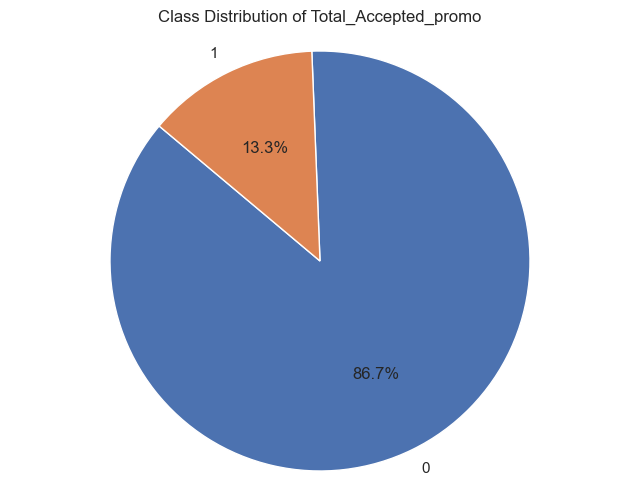

In [783]:
import matplotlib.pyplot as plt

# Calculate class distribution
class_distribution = y.value_counts(normalize=True)

# Plot pie chart
plt.figure(figsize=(8, 6))
plt.pie(class_distribution, labels=class_distribution.index, autopct='%1.1f%%', startangle=140)
plt.title('Class Distribution of Total_Accepted_promo')
plt.axis('equal')
plt.show()

In [784]:
!pip install imbalanced-learn


In [785]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Splitting the resampled data into training and validation sets
X_train_resampled, X_valid_resampled, y_train_resampled, y_valid_resampled = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Models with resampled data
models = {
    "XGBoost": XGBClassifier(learning_rate=0.05, n_estimators=300, max_depth=5),
    "Random Forest": RandomForestClassifier(),
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Gradient Boosting": GradientBoostingClassifier()
}

results = {}

for name, model in models.items():
    model.fit(X_train_resampled, y_train_resampled)
    results[name] = evaluate_model(model, X_test, y_test)

# Neural Network
nn_model = Sequential()
nn_model.add(Dense(64, input_dim=X_train_resampled.shape[1], activation='relu'))
nn_model.add(Dense(32, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))
nn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
nn_model.fit(X_train_resampled, y_train_resampled, epochs=50, batch_size=10, verbose=1)
y_pred_nn = (nn_model.predict(X_test) > 0.5).astype("int32")
nn_proba_nn = nn_model.predict(X_test).ravel()
nn_accuracy = accuracy_score(y_test, y_pred_nn)
nn_balanced_accuracy = balanced_accuracy_score(y_test, y_pred_nn)
nn_precision = precision_score(y_test, y_pred_nn)
nn_recall = recall_score(y_test, y_pred_nn)
nn_f1 = f1_score(y_test, y_pred_nn)
nn_roc_auc = roc_auc_score(y_test, nn_proba_nn)
nn_conf_matrix = confusion_matrix(y_test, y_pred_nn)

results["Neural Network"] = {
    "Accuracy": nn_accuracy,
    "Balanced Accuracy": nn_balanced_accuracy,
    "Precision": nn_precision,
    "Recall": nn_recall,
    "F1 Score": nn_f1,
    "ROC-AUC": nn_roc_auc,
    "Confusion Matrix": nn_conf_matrix
}

# Convert results to DataFrame for better visualization
results_df = pd.DataFrame(results).transpose()

print(results_df)

# Display confusion matrices
for model_name, metrics in results.items():
    print(f"Confusion Matrix for {model_name}:")
    print(metrics["Confusion Matrix"])


C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Epoch 1/50


C:\Users\LE TUAN ANH\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


247/247 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5233 - loss: 452.7467
Epoch 2/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5562 - loss: 32.2666
Epoch 3/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6085 - loss: 24.1364
Epoch 4/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5719 - loss: 30.7773
Epoch 5/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5618 - loss: 29.7058
Epoch 6/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5719 - loss: 18.6949
Epoch 7/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5860 - loss: 22.6938
Epoch 8/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5819 - loss: 24.3734
Epoch 9/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6112 - loss: 14.3756
Epoch 10/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5735 - loss: 23.8754
Epoch 11/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5765 - loss: 32.6111
Epoch 12/50
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/ste

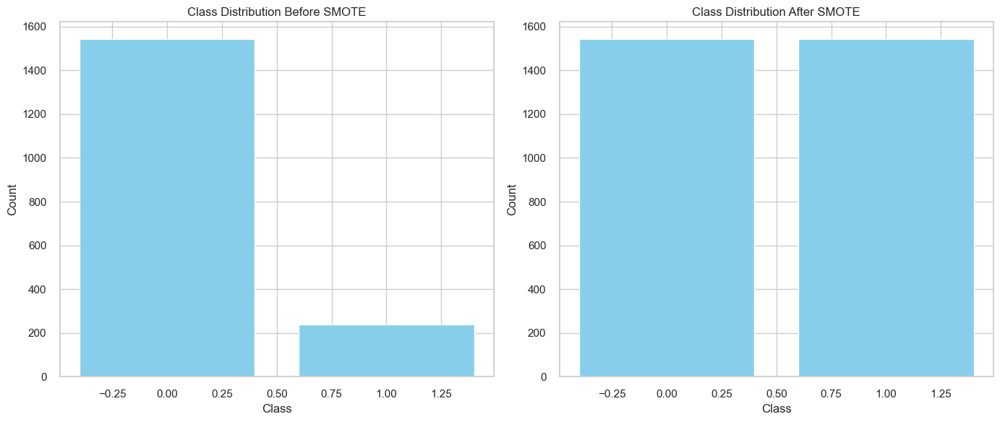

In [786]:
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter
#Plot class distribution before SMOTE
plt.figure(figsize=(14, 6))

# Before SMOTE
plt.subplot(1, 2, 1)
class_counts_before = Counter(y_train)
plt.bar(class_counts_before.keys(), class_counts_before.values(), color='skyblue')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution Before SMOTE')

# After SMOTE
plt.subplot(1, 2, 2)
class_counts_after = Counter(y_resampled)
plt.bar(class_counts_after.keys(), class_counts_after.values(), color='skyblue')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution After SMOTE')

plt.tight_layout()
plt.show()

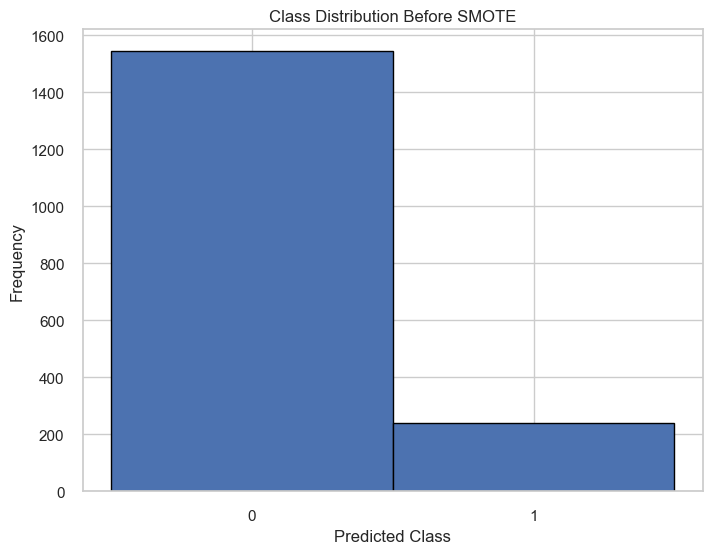

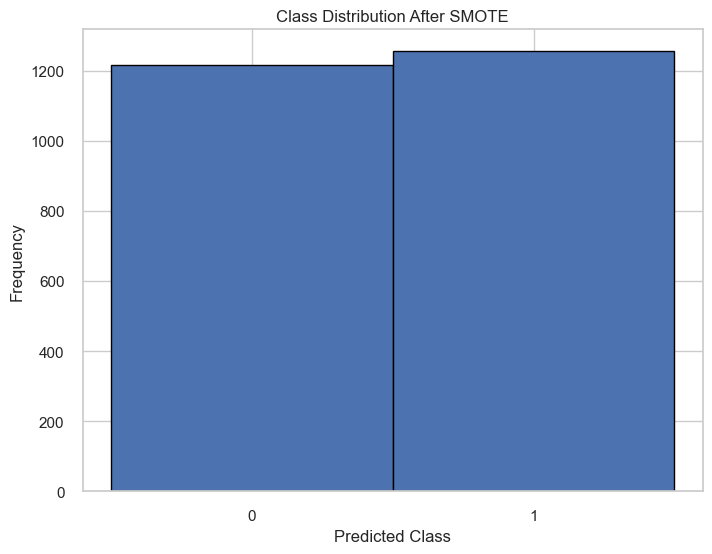

In [787]:
# Plot the histogram for the predicted labels
plt.figure(figsize=(8, 6))
plt.hist(y_train, bins=np.arange(0, 3) - 0.5, edgecolor='black', align='mid')
plt.xticks([0, 1])
plt.xlabel('Predicted Class')
plt.ylabel('Frequency')
plt.title('Class Distribution Before SMOTE')
plt.show()
# Plot the histogram for the predicted labels
plt.figure(figsize=(8, 6))
plt.hist(y_train_resampled, bins=np.arange(0, 3) - 0.5, edgecolor='black', align='mid')
plt.xticks([0, 1])
plt.xlabel('Predicted Class')
plt.ylabel('Frequency')
plt.title('Class Distribution After SMOTE')
plt.show()

Based on these results, we can see that XGBoost and Gradient Boosting have better performance with high accuracy and a large area under the ROC curve.

Some key features of XGBoost include:
1. Flexibility: XGBoost can be used for both classification and regression problems.
2. Handling unbalanced data: XGBoost has built-in mechanisms to handle unbalanced data, including class weights and sampling techniques.
3. High optimization: XGBoost uses many optimization techniques to increase training speed and reduce the possibility of overfitting.
4. Extensible features: XGBoost can be used with many types of data, including structured and unstructured data.
5. Interpretation: XGBoost provides tools to interpret model predictions, including feature importance and data representation.

### **XGBOOST MODEL**

In [791]:
import matplotlib.pyplot as plt
import xgboost as xgb
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Splitting the resampled data into training and validation sets
X_train_resampled, X_valid_resampled, y_train_resampled, y_valid_resampled = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Train XGBoost model with resampled data
xgb_model = XGBClassifier(learning_rate=0.05, n_estimators=300, max_depth=5)
xgb_model.fit(X_train_resampled, y_train_resampled)

# Evaluate the model on the original test set
y_pred_xgb = xgb_model.predict(X_test)
y_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]

In [792]:
y_pred_xgb

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,

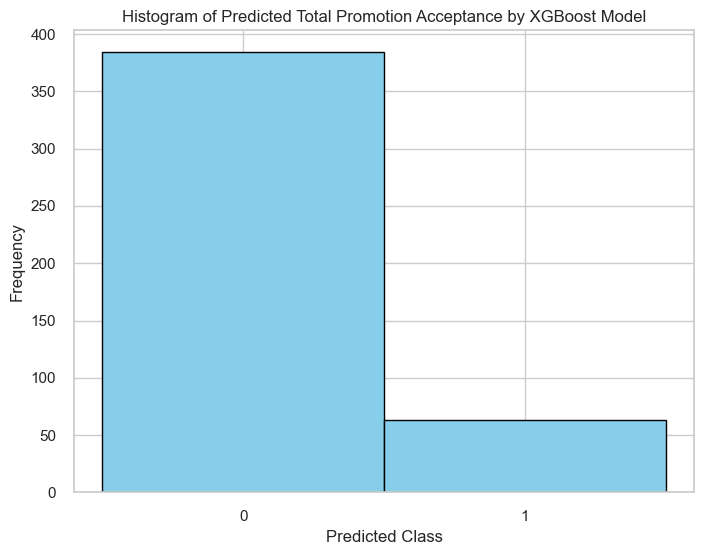

In [793]:
# Plot the histogram for the predicted labels
plt.figure(figsize=(8, 6))
plt.hist(y_pred_xgb, bins=np.arange(0, 3) - 0.5, edgecolor='black', align='mid',color='skyblue')
plt.xticks([0, 1])
plt.xlabel('Predicted Class')
plt.ylabel('Frequency')
plt.title('Histogram of Predicted Total Promotion Acceptance by XGBoost Model')
plt.show()

In [794]:
xgb_accuracy = accuracy_score(y_test, y_pred_xgb)
xgb_balanced_accuracy = balanced_accuracy_score(y_test, y_pred_xgb)
xgb_precision = precision_score(y_test, y_pred_xgb)
xgb_recall = recall_score(y_test, y_pred_xgb)
xgb_f1 = f1_score(y_test, y_pred_xgb)
xgb_roc_auc = roc_auc_score(y_test, y_proba_xgb)
xgb_conf_matrix = confusion_matrix(y_test, y_pred_xgb)

xgb_results = {
    "Accuracy": xgb_accuracy,
    "Balanced Accuracy": xgb_balanced_accuracy,
    "Precision": xgb_precision,
    "Recall": xgb_recall,
    "F1 Score": xgb_f1,
    "ROC-AUC": xgb_roc_auc,
    "Confusion Matrix": xgb_conf_matrix}


In [795]:
xgb_results

{'Accuracy': 0.8590604026845637,
 'Balanced Accuracy': 0.7052429667519182,
 'Precision': 0.4444444444444444,
 'Recall': 0.5,
 'F1 Score': 0.47058823529411764,
 'ROC-AUC': 0.8310193642674462,
 'Confusion Matrix': array([[356,  35],
        [ 28,  28]], dtype=int64)}

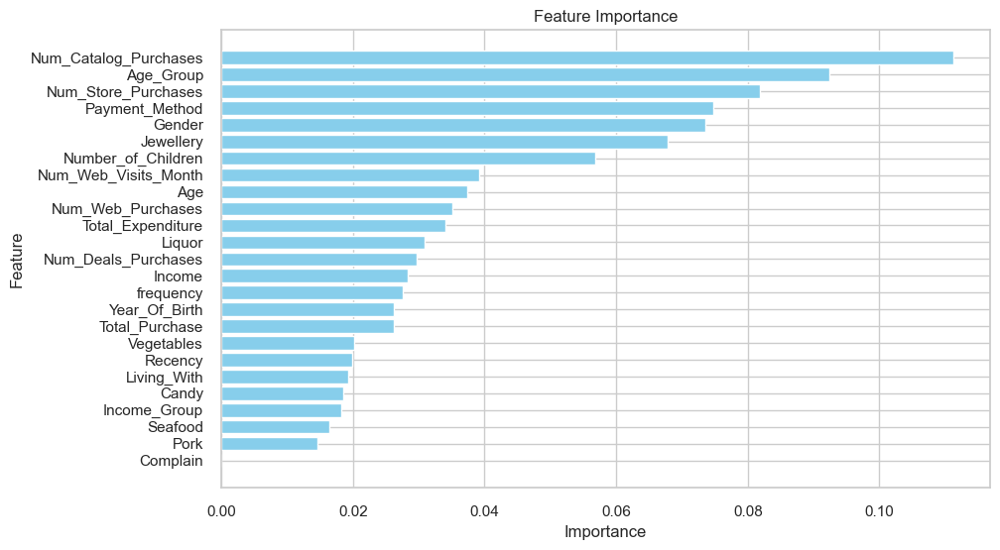

In [796]:
# Get feature importance
feature_importance = xgb_model.feature_importances_
feature_names = X_train.columns

# Create a DataFrame to store feature importance
feature_importance_df = pd.DataFrame({"Feature": feature_names, "Importance": feature_importance})
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)
# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df["Feature"], feature_importance_df["Importance"], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature on top
plt.show()

In [797]:
X_train

,Year_Of_Birth,Income,Recency,Liquor,Vegetables,Pork,Seafood,Candy,Jewellery,Num_Deals_Purchases,...,Gender,Total_Purchase,Living_With,Payment_Method,Number_of_Children,Age,frequency,Age_Group,Total_Expenditure,Income_Group
408,"1,990.00",40049,23.00,14.00,8.00,7.00,0.00,3.00,3.00,1,...,1,5.00,20,2,1,34.00,0.01,0,35.00,0
1090,"1,978.00",85072,94.00,495.00,94.00,391.00,194.00,11.00,241.00,1,...,0,18.00,11,1,0,46.00,0.07,1,"1,426.00",1
2174,"1,987.00",27215,50.00,31.00,7.00,22.00,8.00,9.00,28.00,4,...,1,11.00,6,0,3,37.00,0.01,0,105.00,3
663,"1,988.00",56320,11.00,202.00,55.00,172.00,116.00,77.00,83.00,3,...,2,21.00,8,3,1,36.00,0.03,0,705.00,0
861,"1,989.00",54880,57.00,309.00,87.00,137.00,102.00,45.00,118.00,2,...,1,21.00,12,0,1,35.00,0.02,0,798.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1173,"1,980.00",15345,51.00,6.00,4.00,16.00,3.00,2.00,19.00,2,...,2,6.00,16,3,1,44.00,0.01,1,50.00,3
1998,"1,994.00",44325,69.00,517.00,2.00,21.00,0.00,0.00,5.00,4,...,2,21.00,8,3,1,30.00,0.03,0,545.00,0
504,"1,986.00",69401,41.00,400.00,29.00,159.00,58.00,8.00,39.00,4,...,2,17.00,16,0,1,38.00,0.04,0,693.00,1
1388,"1,990.00",76800,33.00,174.00,28.00,255.00,35.00,71.00,81.00,1,...,0,16.00,7,1,0,34.00,0.05,0,644.00,1


In [798]:
df_promo

,Promotion,Customer_Segment,Accept
0,Promo_30,Recent Big Customers,0.00
1,Promo_30,At Risk Customers,0.00
2,Promo_30,At Risk Customers,0.00
3,Promo_30,Promise Customers,0.00
4,Promo_30,At Risk Customers,0.00
...,...,...,...
11150,Promo_20,Lost Customers,0.00
11151,Promo_20,Lost Customers,0.00
11152,Promo_20,Recent Big Customers,0.00
11153,Promo_20,At Risk Customers,0.00
